In [1]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory


2025-04-16 12:01:02.454383: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744804862.777353      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744804862.871104      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
data_dir = "/kaggle/input/skyview-an-aerial-landscape-dataset/Aerial_Landscapes"
batch_size = 32
img_size = (256, 256)

dataset = image_dataset_from_directory(
    data_dir,
    shuffle=True,
    image_size=img_size,
    batch_size=batch_size
)


Found 12000 files belonging to 15 classes.


I0000 00:00:1744804891.418637      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1744804891.419332      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [3]:
class_names = dataset.class_names
print("Classes:", class_names)


Classes: ['Agriculture', 'Airport', 'Beach', 'City', 'Desert', 'Forest', 'Grassland', 'Highway', 'Lake', 'Mountain', 'Parking', 'Port', 'Railway', 'Residential', 'River']


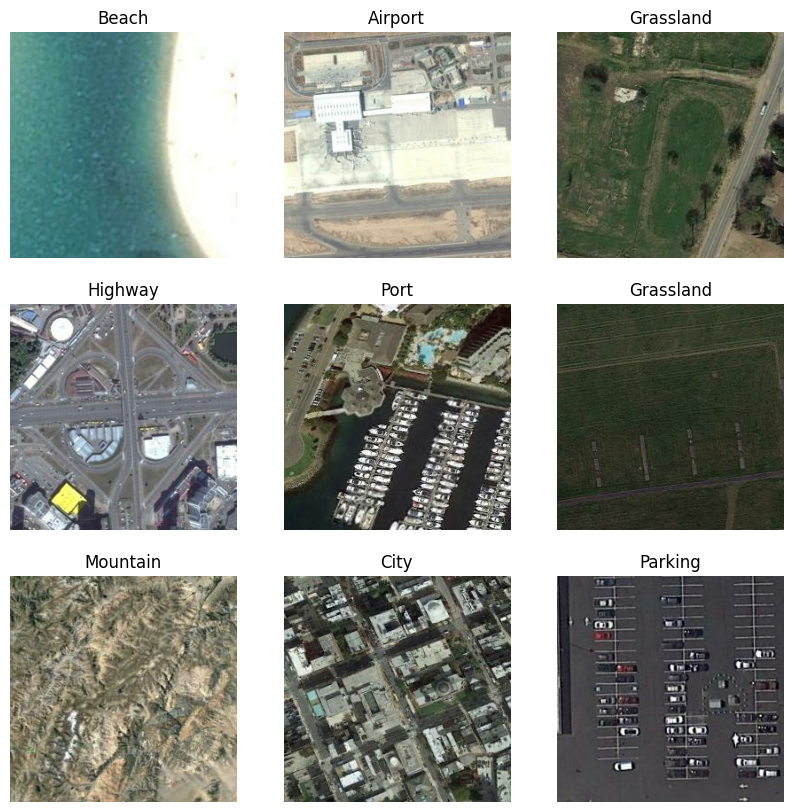

In [4]:
plt.figure(figsize=(10, 10))
for images, labels in dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")


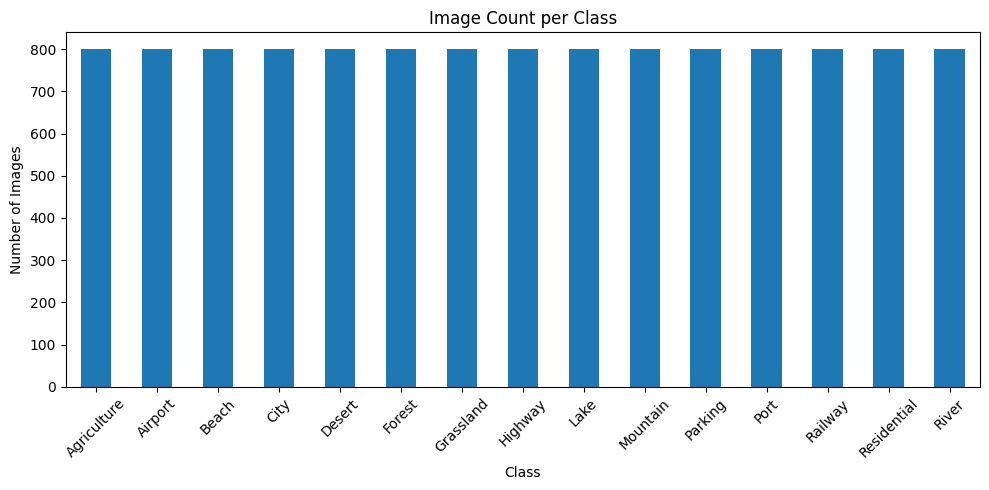

In [5]:
import pandas as pd

class_counts = {cls: len(os.listdir(os.path.join(data_dir, cls))) for cls in class_names}
df = pd.DataFrame(list(class_counts.items()), columns=["Class", "Count"])
df.sort_values(by="Count", ascending=False).plot.bar(x="Class", y="Count", legend=False, figsize=(10,5))
plt.title("Image Count per Class")
plt.ylabel("Number of Images")
plt.xlabel("Class")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# **Train without any Augmentation**

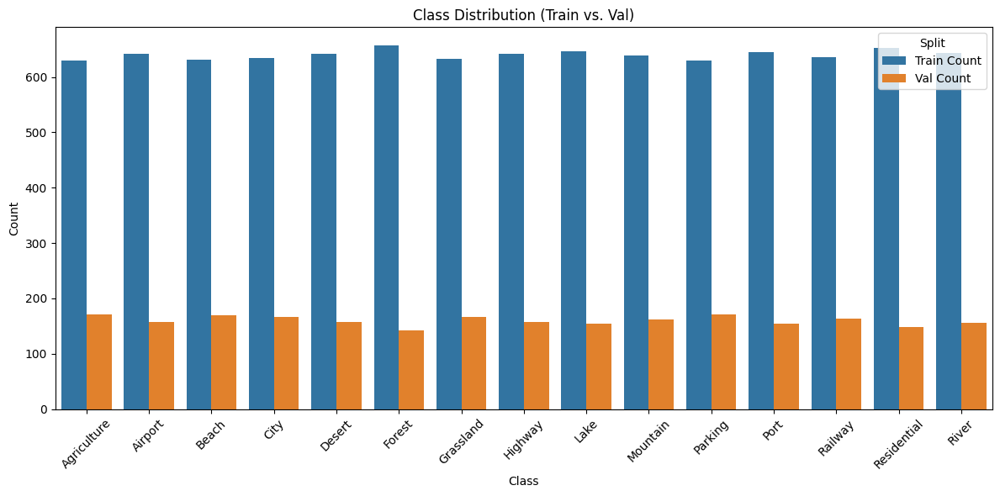

In [18]:
import os
import numpy as np
import tensorflow as tf
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

# Define parameters
data_dir = "/kaggle/input/skyview-an-aerial-landscape-dataset/Aerial_Landscapes"
split_path = "/kaggle/input/skyview-fixed-split"
img_size = (256, 256)
batch_size = 32
seed = 42

# Load fixed indices
train_indices = np.load(f"{split_path}/train_indices.npy")
val_indices = np.load(f"{split_path}/val_indices.npy")

# Map class subfolder names to integer labels
class_names = sorted([entry.name for entry in os.scandir(data_dir) if entry.is_dir()])
class_to_index = {name: idx for idx, name in enumerate(class_names)}

# Helper function to get all image paths and labels
def get_image_paths_and_labels(base_dir):
    image_paths = []
    labels = []
    for class_name in class_names:
        class_dir = os.path.join(base_dir, class_name)
        for fname in sorted(os.listdir(class_dir)):
            if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths.append(os.path.join(class_dir, fname))
                labels.append(class_to_index[class_name])
    return image_paths, labels

# Get all images and labels in order
all_paths, all_labels = get_image_paths_and_labels(data_dir)

# Split based on indices
train_paths = [all_paths[i] for i in train_indices]
train_labels = [all_labels[i] for i in train_indices]
val_paths = [all_paths[i] for i in val_indices]
val_labels = [all_labels[i] for i in val_indices]

# Convert to tf.data.Dataset
def preprocess(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, img_size)
    image = tf.keras.applications.efficientnet.preprocess_input(image)
    return image, label

train_ds = tf.data.Dataset.from_tensor_slices((train_paths, train_labels)).map(preprocess).shuffle(1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.from_tensor_slices((val_paths, val_labels)).map(preprocess).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Visualize class distributions
train_dist = Counter(train_labels)
val_dist = Counter(val_labels)

df = pd.DataFrame({
    "Class": class_names,
    "Train Count": [train_dist[i] for i in range(len(class_names))],
    "Val Count": [val_dist[i] for i in range(len(class_names))]
})

plt.figure(figsize=(12, 6))
sns.barplot(data=df.melt(id_vars="Class", var_name="Split", value_name="Count"), x="Class", y="Count", hue="Split")
plt.xticks(rotation=45)
plt.title("Class Distribution (Train vs. Val)")
plt.tight_layout()
plt.show()


Epoch 1/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - accuracy: 0.6844 - loss: 0.9980 - val_accuracy: 0.9112 - val_loss: 0.2568
Epoch 2/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - accuracy: 0.8929 - loss: 0.3249 - val_accuracy: 0.9279 - val_loss: 0.2102
Epoch 3/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - accuracy: 0.9220 - loss: 0.2555 - val_accuracy: 0.9317 - val_loss: 0.1901
Epoch 4/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - accuracy: 0.9224 - loss: 0.2299 - val_accuracy: 0.9421 - val_loss: 0.1656
Epoch 5/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step - accuracy: 0.9360 - loss: 0.1845 - val_accuracy: 0.9450 - val_loss: 0.1609
Epoch 6/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - accuracy: 0.9398 - loss: 0.1665 - val_accuracy: 0.9433 - val_loss: 0.1534
Epoch 7/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - accuracy: 0.9490 - loss: 0.1513 - val_accuracy: 0.9463 - val_loss: 0.1633
Epoch 8/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - accuracy: 0.9532 - loss: 0.1364 - 

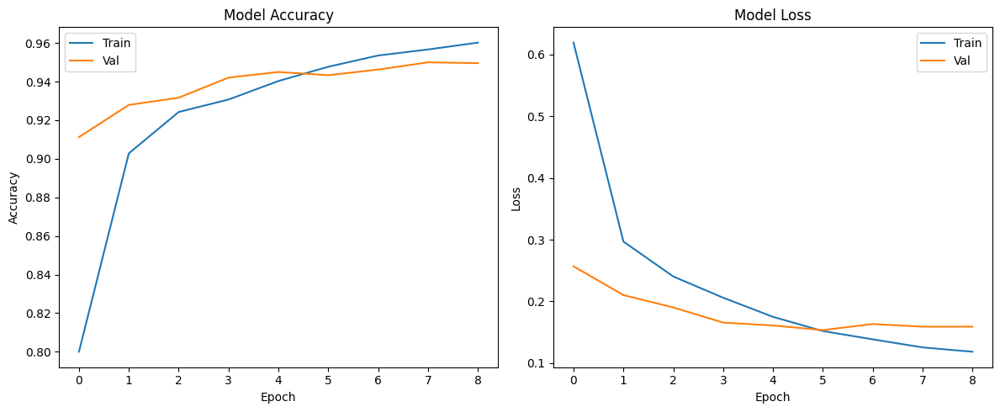

              precision    recall  f1-score   support

 Agriculture       0.98      0.96      0.97       171
     Airport       0.89      0.95      0.92       158
       Beach       0.98      0.98      0.98       169
        City       0.92      0.91      0.92       166
      Desert       0.96      0.94      0.95       158
      Forest       0.91      0.95      0.93       143
   Grassland       0.94      0.93      0.93       167
     Highway       0.96      0.96      0.96       158
        Lake       0.93      0.92      0.93       154
    Mountain       0.94      0.97      0.95       162
     Parking       1.00      0.94      0.97       171
        Port       0.95      0.96      0.96       155
     Railway       0.90      0.94      0.92       164
 Residential       0.97      0.96      0.96       148
       River       0.94      0.87      0.90       156

    accuracy                           0.94      2400
   macro avg       0.94      0.94      0.94      2400
weighted avg       0.94   

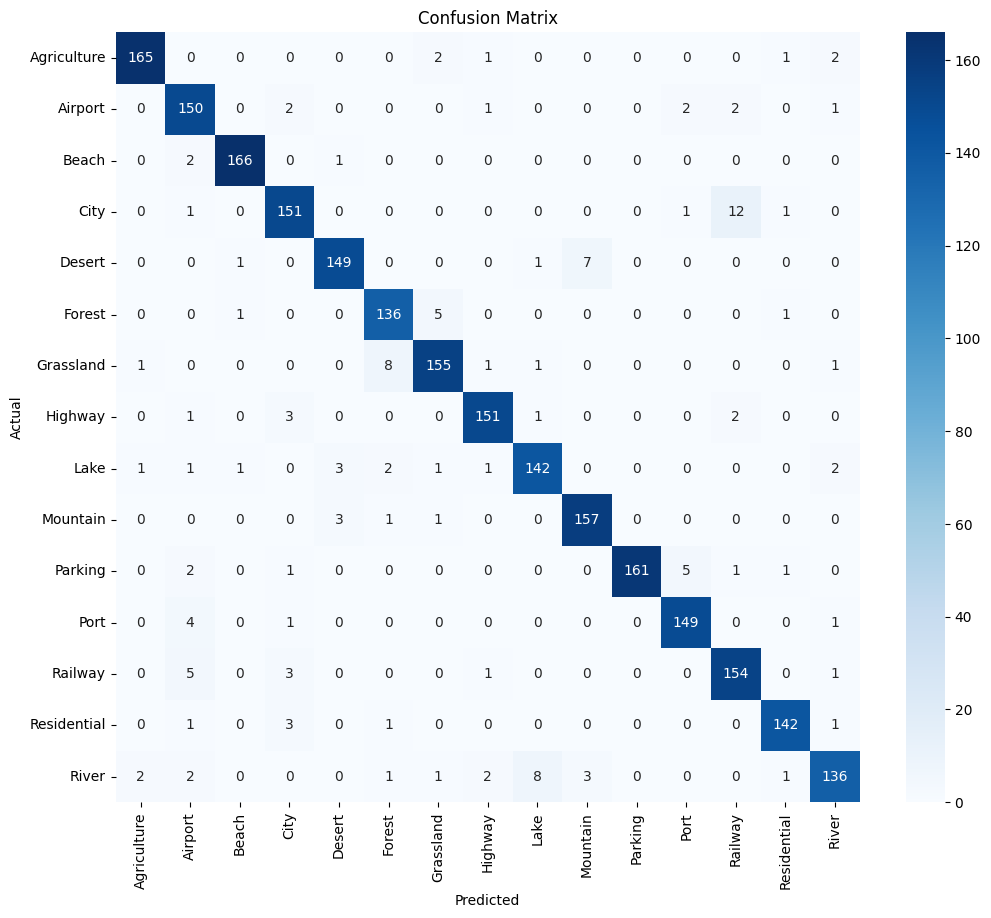

In [19]:
# -------------------------------
# 1. Imports
# -------------------------------
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
# ------------------------------------------------------------------------------------------------------
# -------------------------------
# 2. Dataset Path & Params
# -------------------------------
data_dir = "/kaggle/input/skyview-an-aerial-landscape-dataset/Aerial_Landscapes"
img_size = (256, 256)
batch_size = 32
seed = 42

# -------------------------------
# 3. Load Dataset (80/20 split)
# -------------------------------
split_path = "/kaggle/input/skyview-fixed-split"
train_indices = np.load(f"/kaggle/input/skyview-fixed-split/train_indices.npy")
val_indices = np.load(f"/kaggle/input/skyview-fixed-split/val_indices.npy")

class_names = sorted([entry.name for entry in os.scandir(data_dir) if entry.is_dir()])
class_to_index = {name: idx for idx, name in enumerate(class_names)}

def get_image_paths_and_labels(base_dir):
    image_paths = []
    labels = []
    for class_name in class_names:
        class_dir = os.path.join(base_dir, class_name)
        for fname in sorted(os.listdir(class_dir)):
            if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths.append(os.path.join(class_dir, fname))
                labels.append(class_to_index[class_name])
    return image_paths, labels

all_paths, all_labels = get_image_paths_and_labels(data_dir)

train_paths = [all_paths[i] for i in train_indices]
train_labels = [all_labels[i] for i in train_indices]
val_paths = [all_paths[i] for i in val_indices]
val_labels = [all_labels[i] for i in val_indices]

def preprocess(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, img_size)
    image = tf.keras.applications.efficientnet.preprocess_input(image)
    return image, label

train_ds = tf.data.Dataset.from_tensor_slices((train_paths, train_labels)).map(preprocess).shuffle(1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.from_tensor_slices((val_paths, val_labels)).map(preprocess).batch(batch_size).prefetch(tf.data.AUTOTUNE)


# -------------------------------
# 5. Build Model
# -------------------------------
base_model = EfficientNetB0(
    include_top=False,
    weights=None,  # Disable automatic download
    input_shape=(256, 256, 3)
)

# # Load weights manually
# base_model.load_weights("/kaggle/input/efficientnetb0-weights/efficientnetb0_notop.h5")
# base_model.trainable = False


# Load EfficientNetB0 with pretrained ImageNet weights and exclude top
base_model = EfficientNetB0(
    include_top=False,
    weights="imagenet",  # ← this automatically downloads from the internet
    input_shape=(256, 256, 3)
)
base_model.trainable = False  # Freeze feature extractor


model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

# -------------------------------
# 6. Compile Model
# -------------------------------
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# -------------------------------
# 7. Train Model
# -------------------------------
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[early_stop]
)

# -------------------------------
# 8. Plot Accuracy & Loss
# -------------------------------
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# -------------------------------
# 9. Evaluation: Confusion Matrix + Report
# -------------------------------
# Unbatch validation set
y_true = []
y_pred = []

for images, labels in val_ds.unbatch():
    y_true.append(labels.numpy())
    preds = model.predict(tf.expand_dims(images, axis=0), verbose=0)
    y_pred.append(np.argmax(preds))

# Classification report
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()



📊 Classification Report:

              precision    recall  f1-score   support

 Agriculture       0.98      0.96      0.97       171
     Airport       0.89      0.95      0.92       158
       Beach       0.98      0.98      0.98       169
        City       0.92      0.91      0.92       166
      Desert       0.96      0.94      0.95       158
      Forest       0.91      0.95      0.93       143
   Grassland       0.94      0.93      0.93       167
     Highway       0.96      0.96      0.96       158
        Lake       0.93      0.92      0.93       154
    Mountain       0.94      0.97      0.95       162
     Parking       1.00      0.94      0.97       171
        Port       0.95      0.96      0.96       155
     Railway       0.90      0.94      0.92       164
 Residential       0.97      0.96      0.96       148
       River       0.94      0.87      0.90       156

    accuracy                           0.94      2400
   macro avg       0.94      0.94      0.94      2400

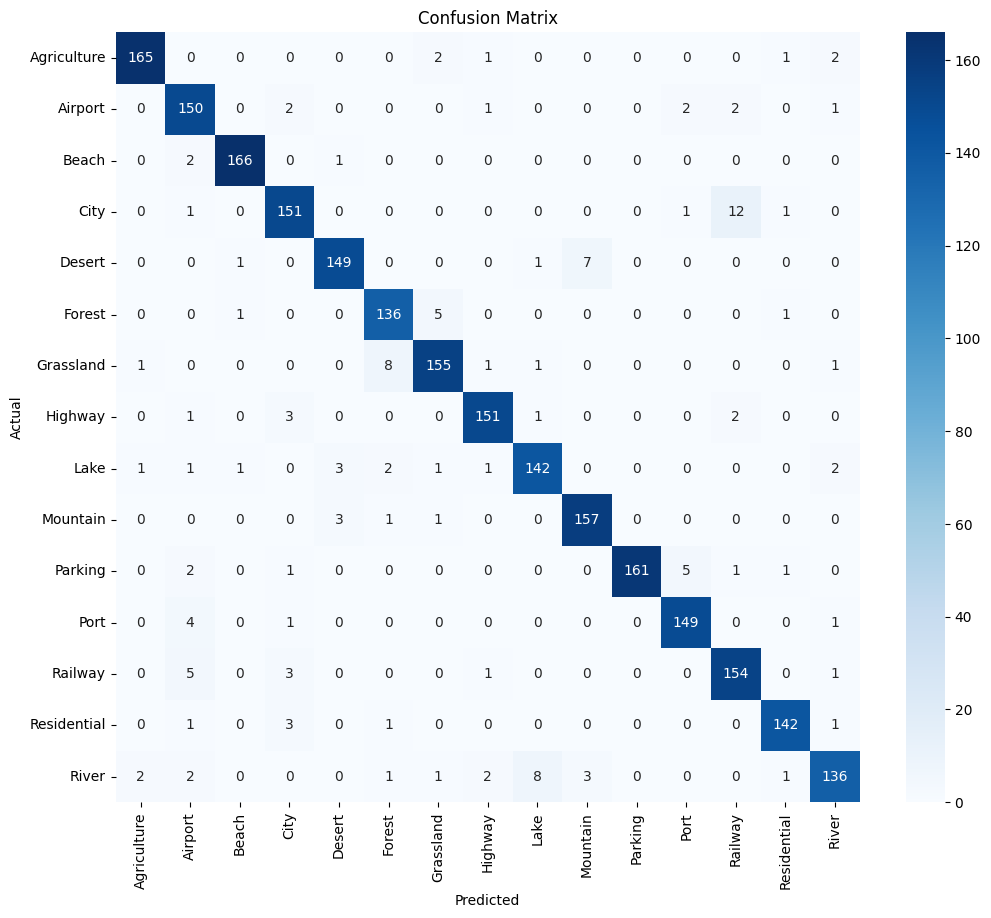

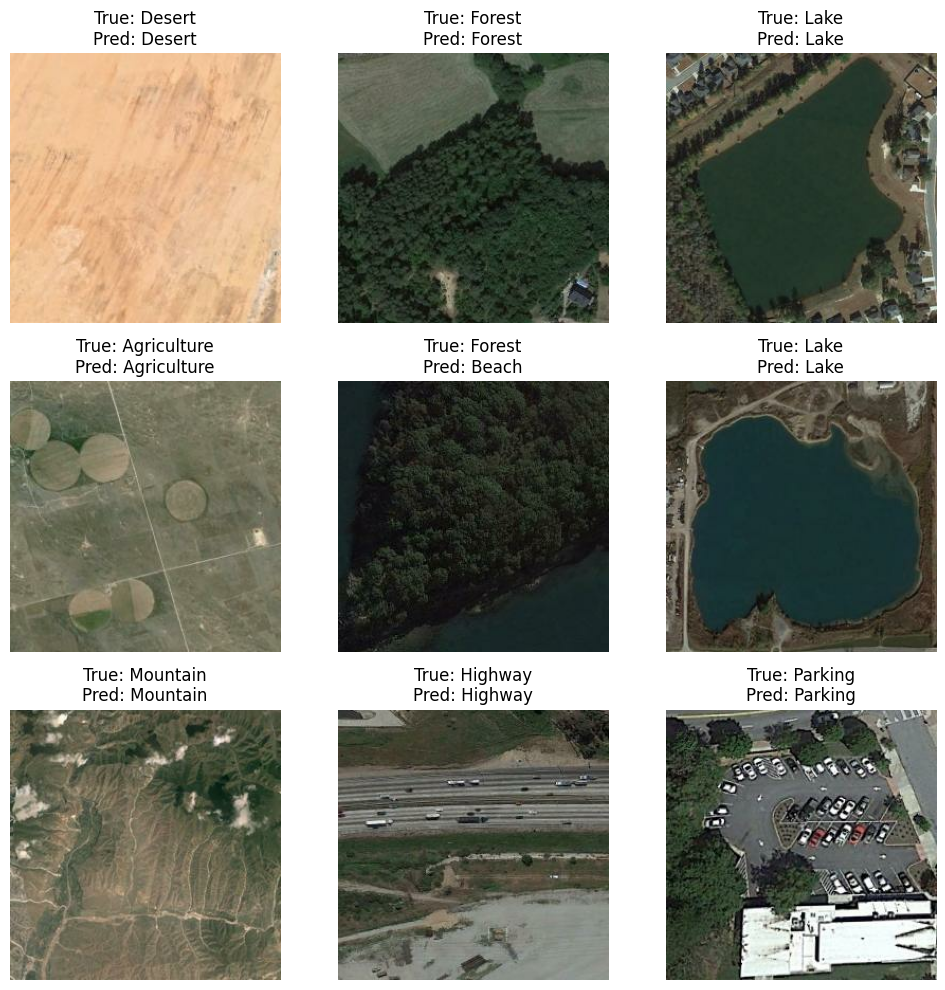

In [20]:
# -------------------------------
# 10. Evaluation Utilities
# -------------------------------
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import cv2

# # Get class names and initialize lists
# class_names = train_ds.class_names
# num_classes = len(class_names)

# -------------------------------
# 11. Get True & Predicted Labels
# -------------------------------
y_true = []
y_pred = []

for images, labels in val_ds.unbatch():
    y_true.append(labels.numpy())
    preds = model.predict(tf.expand_dims(images, axis=0), verbose=0)
    y_pred.append(np.argmax(preds))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# -------------------------------
# 12. Classification Report
# -------------------------------
print("\n📊 Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# -------------------------------
# 13. Accuracy Score
# -------------------------------
acc = accuracy_score(y_true, y_pred)
print(f"\n✅ Overall Accuracy: {acc:.4f}")

# -------------------------------
# 14. Confusion Matrix
# -------------------------------
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# -------------------------------
# 15. Sample Visualization with Prediction
# -------------------------------
import random

sample_images, sample_labels = next(iter(val_ds.unbatch().batch(9)))
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    pred = model.predict(tf.expand_dims(sample_images[i], axis=0), verbose=0)
    true_label = class_names[sample_labels[i].numpy()]
    pred_label = class_names[np.argmax(pred)]
    plt.imshow(sample_images[i].numpy().astype("uint8"))
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# -------------------------------
# 16. Perturbation Testing Placeholder
# -------------------------------
def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.uint8)
    return np.clip(img + noise, 0, 255)

def add_occlusion(img, size=50):
    img = img.numpy().astype("uint8").copy()
    h, w = img.shape[:2]
    x = np.random.randint(0, w - size)
    y = np.random.randint(0, h - size)
    img[y:y+size, x:x+size] = 0
    return img

def apply_blur(img, k=5):
    return cv2.GaussianBlur(img.numpy().astype("uint8"), (k, k), 0)

# Example usage:
# perturbed = add_occlusion(sample_images[0])
# plt.imshow(perturbed)
# pred = model.predict(tf.expand_dims(perturbed, axis=0))
# print("Predicted class:", class_names[np.argmax(pred)])


# **Train with data augmentation (MIXUP)**

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc: 0.7231, Val Acc: 0.9550
Epoch 2: Train Acc: 0.8613, Val Acc: 0.9742
Epoch 3: Train Acc: 0.8672, Val Acc: 0.9775
Epoch 4: Train Acc: 0.8800, Val Acc: 0.9762
Epoch 5: Train Acc: 0.8881, Val Acc: 0.9825
Epoch 6: Train Acc: 0.8812, Val Acc: 0.9838
Epoch 7: Train Acc: 0.8912, Val Acc: 0.9875
Epoch 8: Train Acc: 0.8796, Val Acc: 0.9867
Epoch 9: Train Acc: 0.8983, Val Acc: 0.9821
Epoch 10: Train Acc: 0.9008, Val Acc: 0.9850
Early stopping triggered.


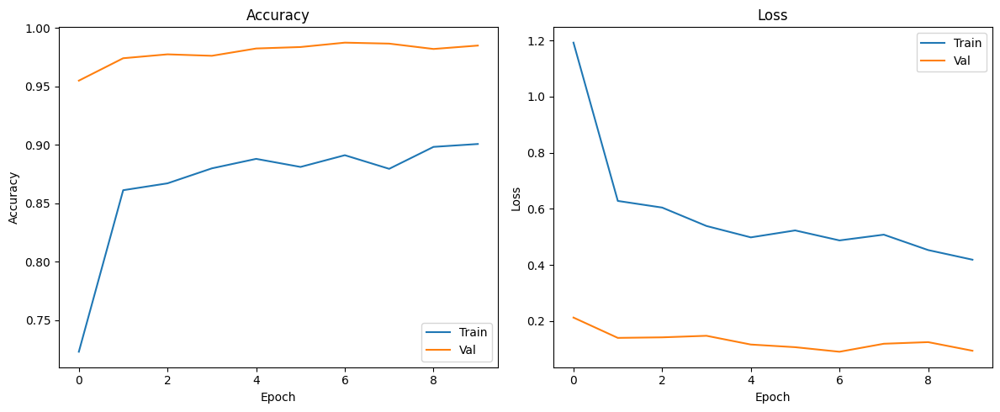

/tmp/ipykernel_99/391467494.py:184: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))



📊 Classification Report:

              precision    recall  f1-score   support

 Agriculture       0.99      0.99      0.99       171
     Airport       0.99      1.00      1.00       158
       Beach       1.00      1.00      1.00       169
        City       0.98      0.97      0.98       166
      Desert       0.99      0.97      0.98       158
      Forest       1.00      1.00      1.00       143
   Grassland       1.00      0.99      0.99       167
     Highway       0.99      0.97      0.98       158
        Lake       0.96      0.98      0.97       154
    Mountain       0.98      0.98      0.98       162
     Parking       0.99      0.99      0.99       171
        Port       0.99      0.99      0.99       155
     Railway       0.98      0.99      0.98       164
 Residential       0.98      0.99      0.99       148
       River       0.98      0.99      0.98       156

    accuracy                           0.99      2400
   macro avg       0.99      0.99      0.99      2400

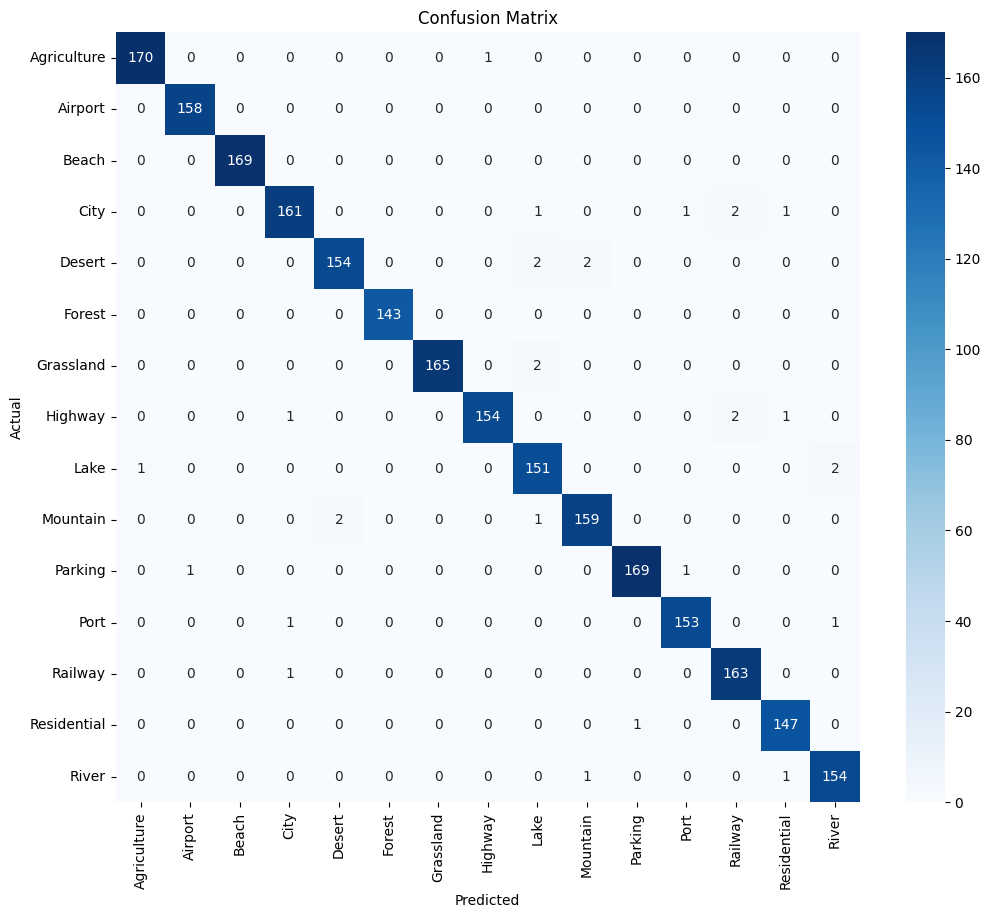

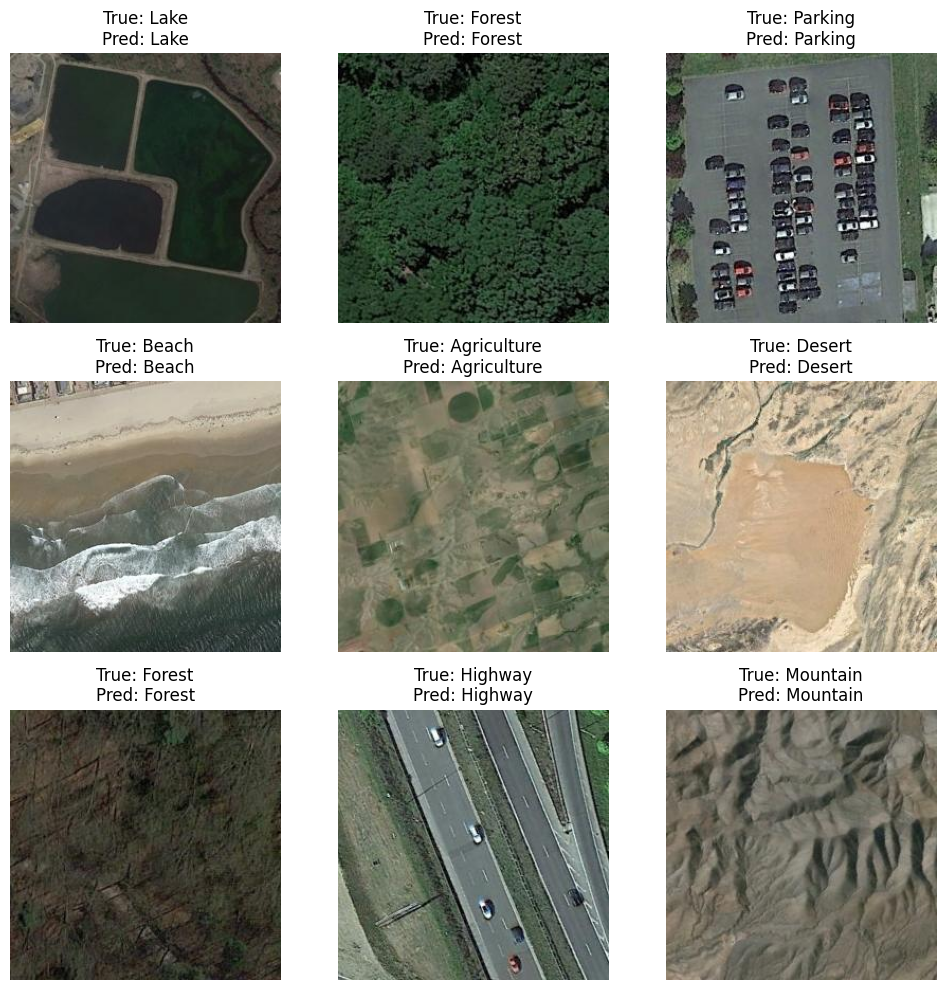

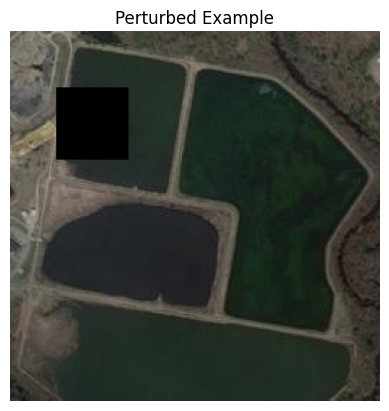

Predicted class: Lake


In [1]:
# -------------------------------
# 1. Imports
# -------------------------------
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2

# -------------------------------
# 2. Dataset Path & Params
# -------------------------------
data_dir = "/kaggle/input/skyview-an-aerial-landscape-dataset/Aerial_Landscapes"
img_size = 256
batch_size = 32
seed = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set random seeds
random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)

# -------------------------------
# 3. Define Transforms (MixUp will be applied in training loop)
# -------------------------------
train_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

# -------------------------------
# 4. Load Dataset
# -------------------------------
# Load datasets using the same ImageFolder (with transforms)
dataset = ImageFolder(data_dir, transform=train_transforms)
val_dataset = ImageFolder(data_dir, transform=val_transforms)
num_classes = len(dataset.classes)

# Load saved split indices
split_path = "/kaggle/input/skyview-fixed-split"  # Update path if needed
train_idx = np.load(f"/kaggle/input/skyview-fixed-split/train_indices.npy")
val_idx = np.load(f"/kaggle/input/skyview-fixed-split/val_indices.npy")

# Use SubsetRandomSampler with loaded indices
train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)

# Use the same dataset for both loaders (they just sample different indices)
train_loader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler)
val_loader = DataLoader(dataset, batch_size=batch_size, sampler=val_sampler)


# -------------------------------
# 5. MixUp Function
# -------------------------------
def mixup_data(x, y, alpha=0.2):
    lam = np.random.beta(alpha, alpha)
    batch_size = x.size()[0]
    index = torch.randperm(batch_size)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# -------------------------------
# 6. Build Model (EfficientNetB0)
# -------------------------------
model = torchvision.models.efficientnet_b0(pretrained=True)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model.to(device)

# -------------------------------
# 7. Train Model
# -------------------------------
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()
epochs = 30
early_stop_patience = 3
best_val_loss = np.inf
patience_counter = 0

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        inputs, targets_a, targets_b, lam = mixup_data(inputs, targets)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = mixup_criterion(criterion, outputs, targets_a, targets_b, lam)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += targets.size(0)
        correct += (lam * predicted.eq(targets_a).sum().item() + (1 - lam) * predicted.eq(targets_b).sum().item())

    train_losses.append(running_loss / len(train_loader))
    train_accuracies.append(correct / total)

    # Validation
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

    val_losses.append(val_loss / len(val_loader))
    val_accuracies.append(correct / total)

    print(f"Epoch {epoch+1}: Train Acc: {train_accuracies[-1]:.4f}, Val Acc: {val_accuracies[-1]:.4f}")

    if val_losses[-1] < best_val_loss:
        best_val_loss = val_losses[-1]
        torch.save(model.state_dict(), "efficientnet_mixup_best.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= early_stop_patience:
            print("Early stopping triggered.")
            break

# -------------------------------
# 8. Plot Accuracy & Loss
# -------------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_accuracies, label='Train')
plt.plot(val_accuracies, label='Val')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_losses, label='Train')
plt.plot(val_losses, label='Val')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------
# 9. Evaluation on Validation Set: Confusion Matrix + Report + Samples
# -------------------------------
y_true = []
y_pred = []
model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))
model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true.extend(labels.numpy())
        y_pred.extend(predicted.cpu().numpy())

print("\n📊 Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=val_dataset.classes))

acc = accuracy_score(y_true, y_pred)
print(f"\n✅ Overall Accuracy: {acc:.4f}")

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=val_dataset.classes, yticklabels=val_dataset.classes, cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Sample visualization
sample_loader = DataLoader(val_dataset, batch_size=9, sampler=val_sampler)
sample_images, sample_labels = next(iter(sample_loader))
sample_images, sample_labels = sample_images.to(device), sample_labels.to(device)

model.eval()
with torch.no_grad():
    preds = model(sample_images)
    pred_labels = torch.argmax(preds, axis=1)

plt.figure(figsize=(10, 10))
for i in range(9):
    img = sample_images[i].permute(1, 2, 0).cpu().numpy()
    true_label = val_dataset.classes[sample_labels[i]]
    pred_label = val_dataset.classes[pred_labels[i]]
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# Perturbation examples

# Convert to uint8 image
def to_uint8(tensor_img):
    img = tensor_img.permute(1, 2, 0).cpu().numpy()
    img = (img * 255).astype(np.uint8)
    return img

def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.uint8)
    return np.clip(img + noise, 0, 255)

def add_occlusion(img, size=50):
    h, w = img.shape[:2]
    x = np.random.randint(0, w - size)
    y = np.random.randint(0, h - size)
    img = img.copy()
    img[y:y+size, x:x+size] = 0
    return img

def apply_blur(img, k=5):
    return cv2.GaussianBlur(img, (k, k), 0)

# Example:
perturbed = add_occlusion(to_uint8(sample_images[0]))
plt.imshow(perturbed)
plt.title("Perturbed Example")
plt.axis("off")
plt.show()

perturbed_tensor = transforms.ToTensor()(perturbed).unsqueeze(0).to(device)
model.eval()
with torch.no_grad():
    output = model(perturbed_tensor)
    pred_idx = output.argmax(dim=1).item()
print("Predicted class:", val_dataset.classes[pred_idx])


In [ ]:
# # Update the path to wherever your group saved the split dataset
# split_path = "/kaggle/input/skyview-fixed-split"

# train_idx = np.load(f"{split_path}/train_indices.npy")
# val_idx = np.load(f"{split_path}/val_indices.npy")

# train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
# val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)

# train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=train_sampler)
# val_loader = DataLoader(val_dataset, batch_size=batch_size, sampler=val_sampler)


In [6]:
# split_path = "/kaggle/input/skyview-fixed-split"

# train_idx = np.load(f"/kaggle/input/skyview-fixed-split/train_indices.npy")
# val_idx = np.load(f"/kaggle/input/skyview-fixed-split/val_indices.npy")
# print(f"🧾 Number of training images: {len(train_idx)}")
# print(f"🧾 Number of validation images: {len(val_idx)}")


🧾 Number of training images: 9600
🧾 Number of validation images: 2400


In [4]:
# # Only run this ONCE to generate and save indices
# indices = list(range(len(train_dataset)))
# random.shuffle(indices)
# split = int(np.floor(0.2 * len(train_dataset)))
# train_idx, val_idx = indices[split:], indices[:split]

# # Save to disk
# np.save("train_indices.npy", train_idx)
# np.save("val_indices.npy", val_idx)


In [2]:
!pip install torchcam --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 23.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 47.9 MB/s eta 0:00:0000:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is incompatib

# resample imbalance

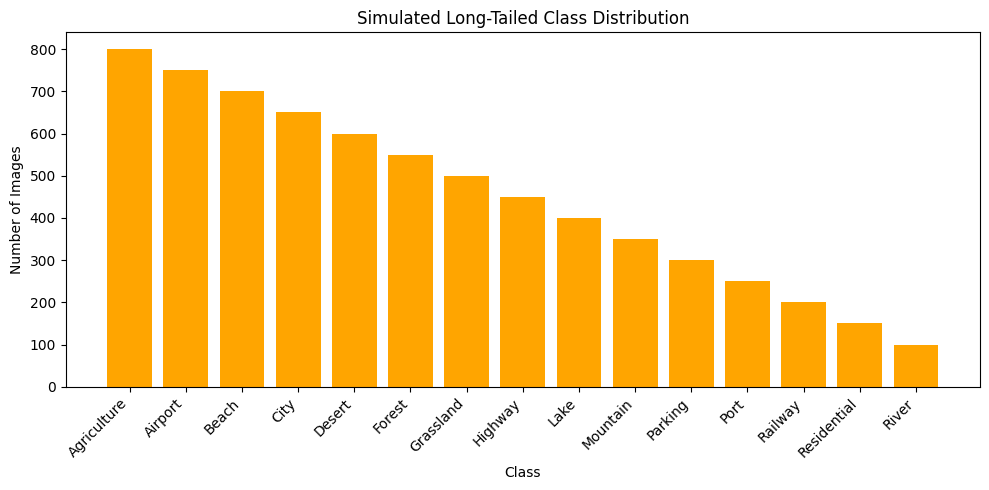

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc: 0.6426, Val Acc: 0.9459
Epoch 2: Train Acc: 0.8446, Val Acc: 0.9719
Epoch 3: Train Acc: 0.8643, Val Acc: 0.9770
Epoch 4: Train Acc: 0.8726, Val Acc: 0.9822
Epoch 5: Train Acc: 0.8724, Val Acc: 0.9822
Epoch 6: Train Acc: 0.8810, Val Acc: 0.9837
Epoch 7: Train Acc: 0.8920, Val Acc: 0.9800
Epoch 8: Train Acc: 0.8928, Val Acc: 0.9830
Epoch 9: Train Acc: 0.8789, Val Acc: 0.9859
Epoch 10: Train Acc: 0.8777, Val Acc: 0.9837
Epoch 11: Train Acc: 0.9061, Val Acc: 0.9844
Epoch 12: Train Acc: 0.8969, Val Acc: 0.9867
Epoch 13: Train Acc: 0.8711, Val Acc: 0.9815
Early stopping triggered.
▶️ Stage 2: Retraining classifier head...


/tmp/ipykernel_99/1557183474.py:211: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))


Epoch 1 (Stage 2): Classifier Accuracy: 0.9961, Loss: 0.0404
Epoch 2 (Stage 2): Classifier Accuracy: 0.9956, Loss: 0.0277
Epoch 3 (Stage 2): Classifier Accuracy: 0.9954, Loss: 0.0212


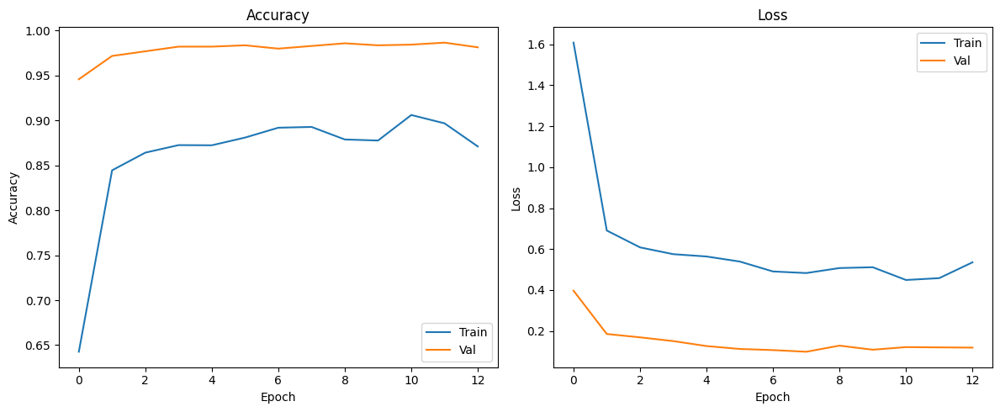

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/tmp/ipykernel_99/1557183474.py:276: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functio

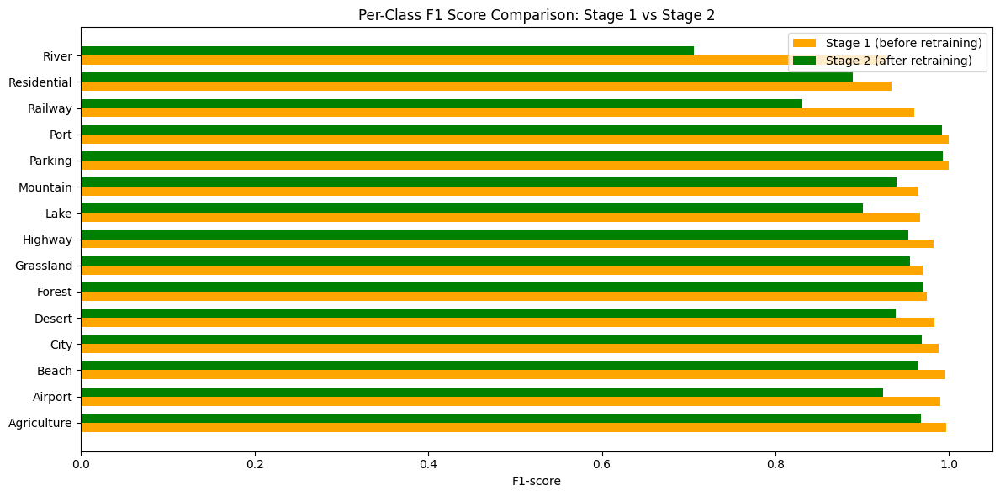

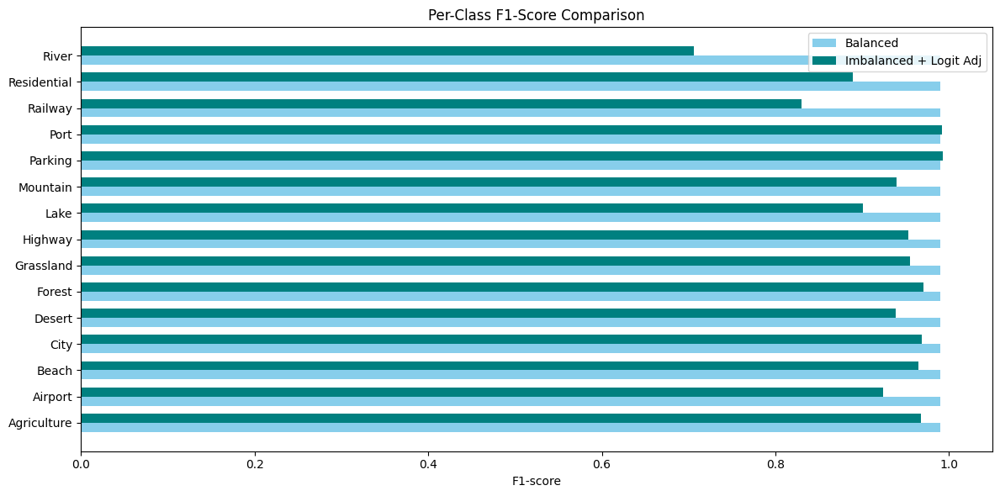

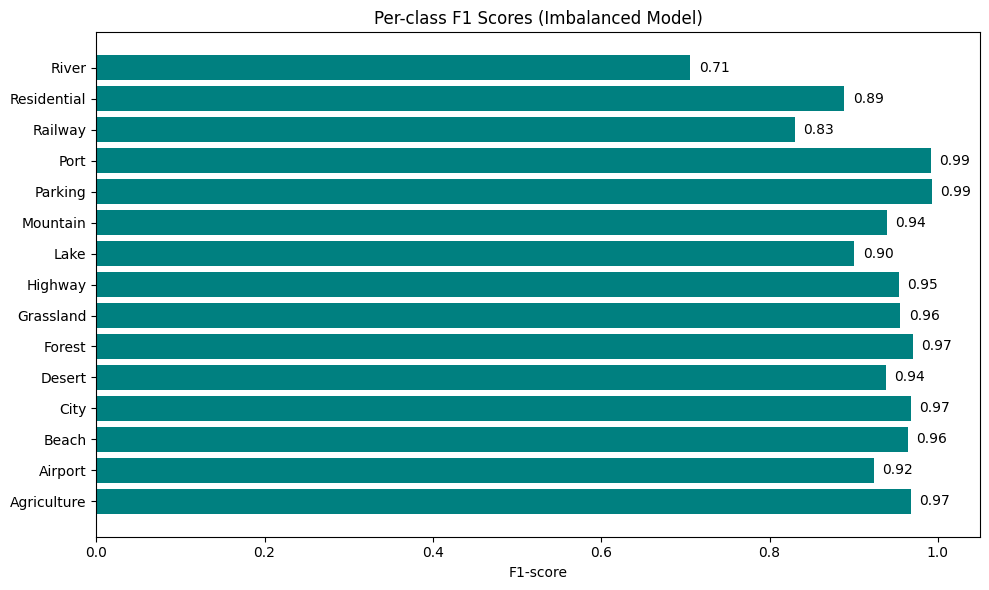

/tmp/ipykernel_99/1557183474.py:366: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))



📊 Classification Report:

              precision    recall  f1-score   support

 Agriculture       1.00      0.99      1.00       177
     Airport       0.99      0.99      0.99       146
       Beach       1.00      0.99      1.00       127
        City       0.99      0.98      0.99       127
      Desert       1.00      0.97      0.98       121
      Forest       0.99      0.96      0.97       119
   Grassland       0.95      0.99      0.97        97
     Highway       0.99      0.98      0.98        86
        Lake       0.94      1.00      0.97        73
    Mountain       0.95      0.98      0.96        55
     Parking       1.00      1.00      1.00        69
        Port       1.00      1.00      1.00        60
     Railway       0.96      0.96      0.96        50
 Residential       0.91      0.95      0.93        22
       River       0.95      0.90      0.93        21

    accuracy                           0.98      1350
   macro avg       0.97      0.98      0.98      1350

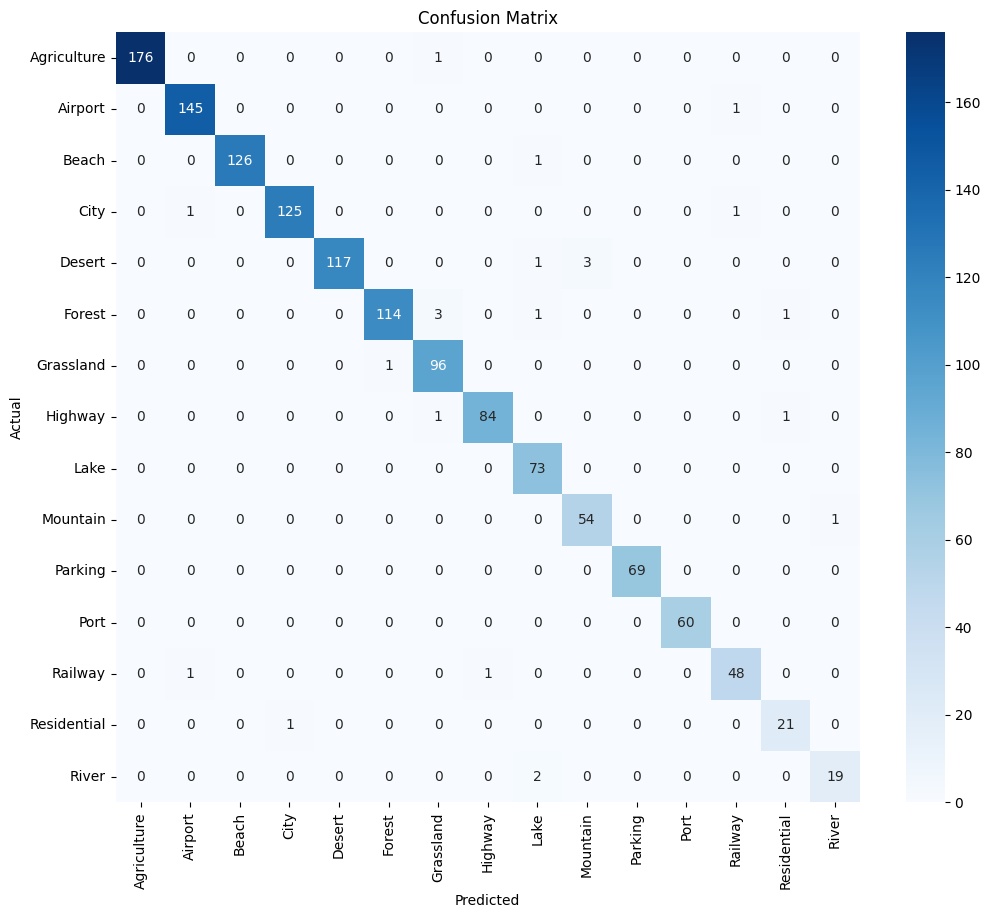

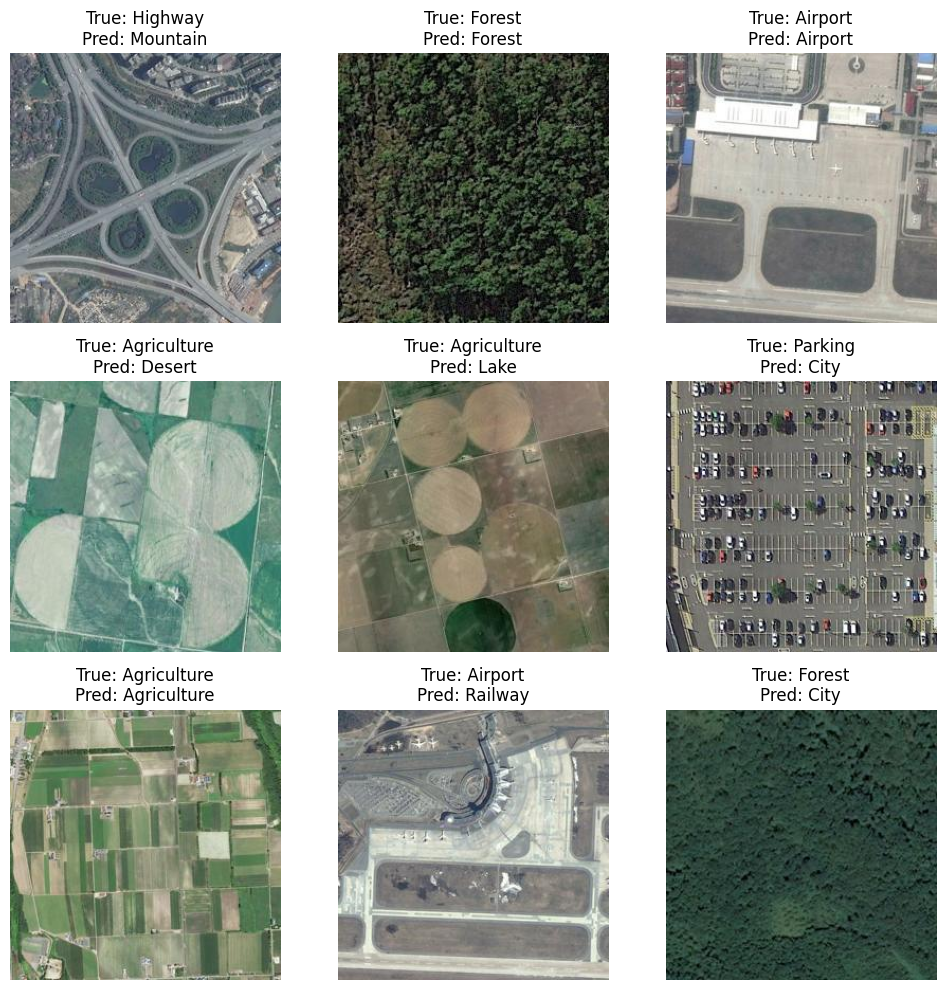

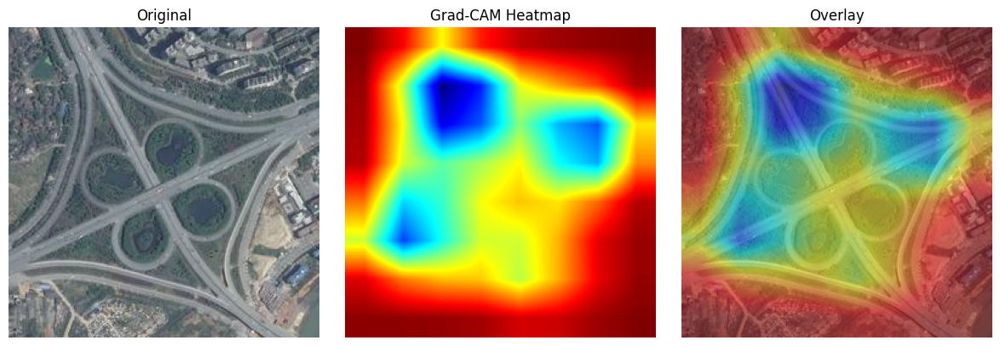

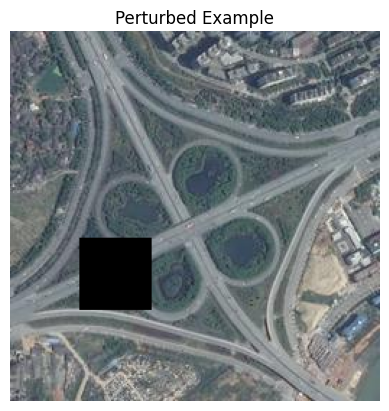

Predicted class: Highway


In [6]:
# -------------------------------
# 1. Imports
# -------------------------------
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
from sklearn.metrics import precision_recall_fscore_support
from torchcam.methods import GradCAM
# -------------------------------
# 2. Dataset Path & Params
# -------------------------------
data_dir = "/kaggle/input/skyview-an-aerial-landscape-dataset/Aerial_Landscapes"
img_size = 256
batch_size = 32
seed = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set random seeds
random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)

# -------------------------------
# 3. Define Transforms (MixUp will be applied in training loop)
# -------------------------------
train_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])


# -------------------------------
# 4. Load Dataset (Simulate Long-Tailed Imbalance)
# -------------------------------
train_dataset = ImageFolder(data_dir, transform=train_transforms)
val_dataset = ImageFolder(data_dir, transform=val_transforms)

num_classes = len(train_dataset.classes)



# Target long-tailed distribution: 800, 700, ..., 50 (per class)
long_tail_counts = [800 - i*50 for i in range(15)]  # [800, 750, ..., 50]
class_indices = {i: [] for i in range(len(train_dataset.classes))}

for idx, (_, label) in enumerate(train_dataset.samples):
    class_indices[label].append(idx)

imbalanced_indices = []
for class_id, target_count in enumerate(long_tail_counts):
    selected = class_indices[class_id][:target_count]  # take top-N per class
    imbalanced_indices.extend(selected)

random.shuffle(imbalanced_indices)
split = int(0.2 * len(imbalanced_indices))
val_idx = imbalanced_indices[:split]
train_idx = imbalanced_indices[split:]

# Save the new imbalanced split (optional)
np.save("train_indices_imbalanced.npy", train_idx)
np.save("val_indices_imbalanced.npy", val_idx)

train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=train_sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size, sampler=val_sampler)
np.save("train_indices.npy", train_idx)
np.save("val_indices.npy", val_idx)

train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=train_sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size, sampler=val_sampler)


# -------------------------------
# 4.1 Visualize Imbalanced Distribution
# -------------------------------
plt.figure(figsize=(10, 5))
plt.bar(range(len(long_tail_counts)), long_tail_counts, tick_label=train_dataset.classes, color='orange')
plt.xticks(rotation=45, ha='right')
plt.title('Simulated Long-Tailed Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.tight_layout()
plt.show()

# -------------------------------
# 5. MixUp Function
# -------------------------------
def mixup_data(x, y, alpha=0.2):
    lam = np.random.beta(alpha, alpha)
    batch_size = x.size()[0]
    index = torch.randperm(batch_size)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# -------------------------------
# 6. Build Model (EfficientNetB0)
# -------------------------------
# Stage 1: Feature Extractor Training
# -------------------------------
model = torchvision.models.efficientnet_b0(pretrained=True)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model.to(device)

# -------------------------------
# 6.1 Create Class Weights
# -------------------------------
class_counts = np.zeros(num_classes)
for idx in train_idx:
    _, label = train_dataset.samples[idx]
    class_counts[label] += 1
class_weights = 1. / class_counts
weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

# -------------------------------
# 7. Train Model (Stage 1: Feature Extractor with Weighted Loss)
# -------------------------------
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss(weight=weights_tensor)
epochs = 30
early_stop_patience = 5
best_val_loss = np.inf
patience_counter = 0

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        inputs, targets_a, targets_b, lam = mixup_data(inputs, targets)

        optimizer.zero_grad()
        outputs = model(inputs)
        # outputs = apply_logit_adjustment(outputs, class_counts)
        loss = mixup_criterion(criterion, outputs, targets_a, targets_b, lam)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += targets.size(0)
        correct += (lam * predicted.eq(targets_a).sum().item() + (1 - lam) * predicted.eq(targets_b).sum().item())

    train_losses.append(running_loss / len(train_loader))
    train_accuracies.append(correct / total)

    # Validation
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

    val_losses.append(val_loss / len(val_loader))
    val_accuracies.append(correct / total)

    print(f"Epoch {epoch+1}: Train Acc: {train_accuracies[-1]:.4f}, Val Acc: {val_accuracies[-1]:.4f}")

    if val_losses[-1] < best_val_loss:
        best_val_loss = val_losses[-1]
        torch.save(model.state_dict(), "efficientnet_mixup_best.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= early_stop_patience:
            print("Early stopping triggered.")
            break

# -------------------------------
# 7.1 Decoupled Training Stage 2: Freeze Base, Retrain Classifier Only
# -------------------------------
model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))
# Compute F1-stage1
# _, _, f1_stage1, _ = precision_recall_fscore_support(y_true_stage1, y_pred_stage1, labels=list(range(len(val_dataset.classes))))

for param in model.features.parameters():
    param.requires_grad = False

# Reset optimizer for classifier only
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

# Retrain classifier (3 epochs)
print("▶️ Stage 2: Retraining classifier head...")
for epoch in range(3):
    model.train()
    total = 0
    correct = 0
    running_loss = 0
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()
    print(f"Epoch {epoch+1} (Stage 2): Classifier Accuracy: {correct / total:.4f}, Loss: {running_loss / len(train_loader):.4f}")

# Save final model
torch.save(model.state_dict(), "efficientnet_mixup_stage2.pth")
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, labels=list(range(len(val_dataset.classes))))
f1_stage2 = f1

# -------------------------------
# 8. Plot Accuracy & Loss
# -------------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_accuracies, label='Train')
plt.plot(val_accuracies, label='Val')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_losses, label='Train')
plt.plot(val_losses, label='Val')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------
# 9.3 Stage 2 vs Stage 1 F1-score Comparison (Post-Retraining)
# -------------------------------


# Load pre-stage2 model (just before classifier retraining)
model_stage1 = torchvision.models.efficientnet_b0(pretrained=False)
model_stage1.classifier[1] = nn.Linear(model_stage1.classifier[1].in_features, num_classes)
model_stage1.load_state_dict(torch.load("efficientnet_mixup_best.pth"))
model_stage1.to(device)
model_stage1.eval()

# Evaluate again without logit adjustment or retraining
y_pred_stage1 = []
y_true_stage1 = []
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model_stage1(inputs)
        _, predicted = torch.max(outputs, 1)
        y_pred_stage1.extend(predicted.cpu().numpy())
        y_true_stage1.extend(labels.numpy())
        
# Now compute f1_stage1 (after y_true_stage1 is populated)
_, _, f1_stage1, _ = precision_recall_fscore_support(
    y_true_stage1, y_pred_stage1, labels=list(range(len(val_dataset.classes)))
)



# Plot comparison
x = np.arange(len(val_dataset.classes))
width = 0.35

plt.figure(figsize=(12, 6))
plt.barh(x - width/2, f1_stage1, height=width, label='Stage 1 (before retraining)', color='orange')
plt.barh(x + width/2, f1_stage2, height=width, label='Stage 2 (after retraining)', color='green')
plt.yticks(x, val_dataset.classes)
plt.xlabel('F1-score')
plt.title('Per-Class F1 Score Comparison: Stage 1 vs Stage 2')
plt.xlim(0, 1.05)
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------
# 9.2 F1-score Comparison (Balanced vs. Imbalanced)
# -------------------------------
# Example F1-scores from a balanced model (you can replace this with your actual values)
f1_balanced = [0.99] * len(val_dataset.classes)  # placeholder for balanced model

# Plot comparison
x = np.arange(len(val_dataset.classes))
width = 0.35

plt.figure(figsize=(12, 6))
plt.barh(x - width/2, f1_balanced, height=width, label='Balanced', color='skyblue')
plt.barh(x + width/2, f1, height=width, label='Imbalanced + Logit Adj', color='teal')
plt.yticks(x, val_dataset.classes)
plt.xlabel('F1-score')
plt.title('Per-Class F1-Score Comparison')
plt.xlim(0, 1.05)
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------
# 9.1 F1-score Visualization
# -------------------------------


# Compute per-class metrics
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, labels=list(range(len(val_dataset.classes))))

# Horizontal bar plot
plt.figure(figsize=(10, 6))
plt.barh(val_dataset.classes, f1, color='teal')
plt.xlabel('F1-score')
plt.title('Per-class F1 Scores (Imbalanced Model)')
plt.xlim(0, 1.05)
for i, v in enumerate(f1):
    plt.text(v + 0.01, i, f"{v:.2f}", va='center')
plt.tight_layout()
plt.show()

# -------------------------------
# 9. Logit Adjustment Function (Optional: Post-hoc Calibration)
# -------------------------------
def apply_logit_adjustment(logits, class_counts, tau=1.0):
    priors = torch.tensor(class_counts / np.sum(class_counts), dtype=torch.float).to(device)
    adjustment = tau * torch.log(priors + 1e-12)
    return logits + adjustment

# -------------------------------
# 9. Evaluation on Validation Set: Confusion Matrix + Report + Samples
# -------------------------------
y_true = []
y_pred = []
model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))
model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true.extend(labels.numpy())
        y_pred.extend(predicted.cpu().numpy())

print("\n📊 Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=val_dataset.classes))

acc = accuracy_score(y_true, y_pred)
print(f"\n✅ Overall Accuracy: {acc:.4f}")

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=val_dataset.classes, yticklabels=val_dataset.classes, cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Sample visualization
sample_loader = DataLoader(val_dataset, batch_size=9, sampler=val_sampler)
sample_images, sample_labels = next(iter(sample_loader))
sample_images, sample_labels = sample_images.to(device), sample_labels.to(device)

model.eval()
perturbed_tensor.requires_grad_()  # Enable gradients
output = model(perturbed_tensor)
pred_idx = output.argmax(dim=1).item()


plt.figure(figsize=(10, 10))
for i in range(9):
    img = sample_images[i].permute(1, 2, 0).cpu().numpy()
    true_label = val_dataset.classes[sample_labels[i]]
    pred_label = val_dataset.classes[pred_labels[i]]
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# -------------------------------
# 10. Grad-CAM Visual Explanation (Run Separately)
# -------------------------------
# !pip install torchcam --quiet

# from torchcam.methods import GradCAM
# from torchvision.transforms.functional import normalize
# from torchvision.transforms import ToTensor
# from PIL import Image

# # Use the saved best model
# model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))
# model.eval()

# # Register GradCAM on last conv layer
cam_extractor = GradCAM(model, target_layer="features")

# # Pick a sample from validation set
# sample_image = sample_images[0].unsqueeze(0).to(device)
sample_image = sample_images[0].unsqueeze(0).to(device)
sample_image.requires_grad = True  # Important for CAM
output = model(sample_image)
pred_class = output.argmax().item()

# Extract CAM
activation_map = cam_extractor(pred_class, output)[0].squeeze().cpu().numpy()

# Display image + heatmap
img_np = sample_images[0].permute(1, 2, 0).cpu().numpy()
heatmap = cv2.resize(activation_map, (img_np.shape[1], img_np.shape[0]))
heatmap = np.uint8(255 * heatmap / np.max(heatmap))
heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
blended = cv2.addWeighted(to_uint8(sample_images[0]), 0.5, heatmap_color, 0.5, 0)

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(to_uint8(sample_images[0]))
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(heatmap_color)
plt.title("Grad-CAM Heatmap")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(blended)
plt.title("Overlay")
plt.axis("off")
plt.tight_layout()
plt.show()

# Perturbation examples

# Convert to uint8 image
def to_uint8(tensor_img):
    img = tensor_img.permute(1, 2, 0).cpu().numpy()
    img = (img * 255).astype(np.uint8)
    return img

def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.uint8)
    return np.clip(img + noise, 0, 255)

def add_occlusion(img, size=50):
    h, w = img.shape[:2]
    x = np.random.randint(0, w - size)
    y = np.random.randint(0, h - size)
    img = img.copy()
    img[y:y+size, x:x+size] = 0
    return img

def apply_blur(img, k=5):
    return cv2.GaussianBlur(img, (k, k), 0)

# Example:
perturbed = add_occlusion(to_uint8(sample_images[0]))
plt.imshow(perturbed)
plt.title("Perturbed Example")
plt.axis("off")
plt.show()

perturbed_tensor = transforms.ToTensor()(perturbed).unsqueeze(0).to(device)
model.eval()
perturbed_tensor.requires_grad_()  # Enables gradient for CAM
output = model(perturbed_tensor)
pred_idx = output.argmax(dim=1).item()
print("Predicted class:", val_dataset.classes[pred_idx])


# **imbalance dataset without data augmentation**

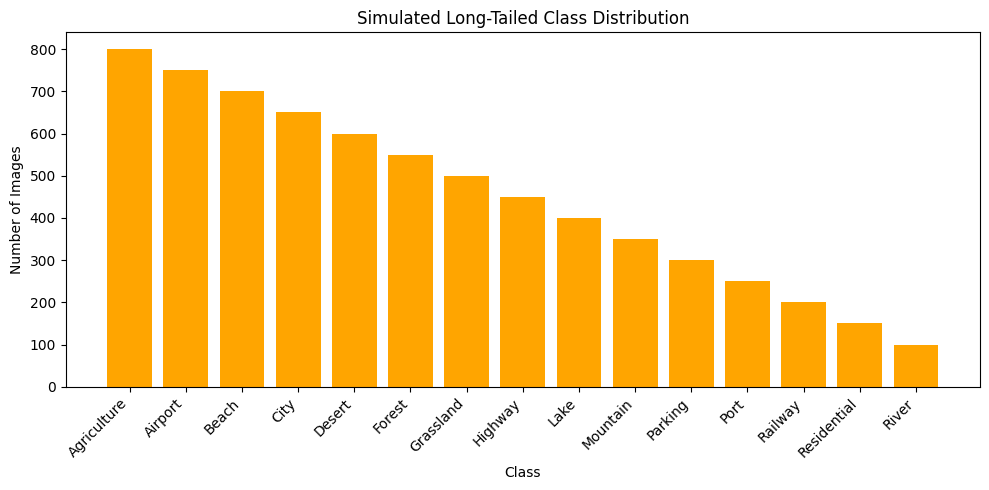

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Acc: 0.7315, Val Acc: 0.7363
Epoch 2: Train Acc: 0.7311, Val Acc: 0.8096
Epoch 3: Train Acc: 0.7987, Val Acc: 0.8607
Epoch 4: Train Acc: 0.8256, Val Acc: 0.8393
Epoch 5: Train Acc: 0.8233, Val Acc: 0.8993
Epoch 6: Train Acc: 0.8493, Val Acc: 0.9000
Epoch 7: Train Acc: 0.8585, Val Acc: 0.8970
Epoch 8: Train Acc: 0.8654, Val Acc: 0.8881
Early stopping triggered.
▶️ Stage 2: Retraining classifier head...


/tmp/ipykernel_99/3496205038.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))


Epoch 1 (Stage 2): Classifier Accuracy: 0.8706, Loss: 0.4131
Epoch 2 (Stage 2): Classifier Accuracy: 0.8883, Loss: 0.3367
Epoch 3 (Stage 2): Classifier Accuracy: 0.8887, Loss: 0.3499


/tmp/ipykernel_99/3496205038.py:236: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("efficientnet_mixup_stage2.pth"))


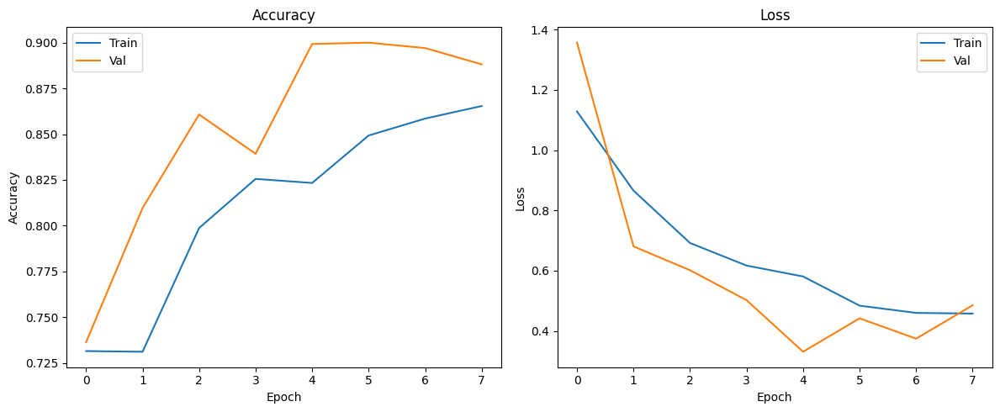

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/tmp/ipykernel_99/3496205038.py:284: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functio

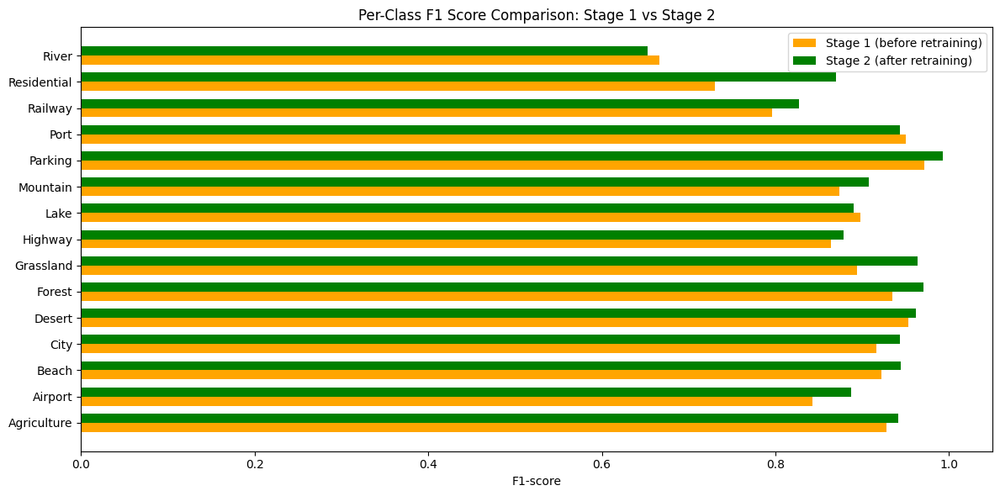

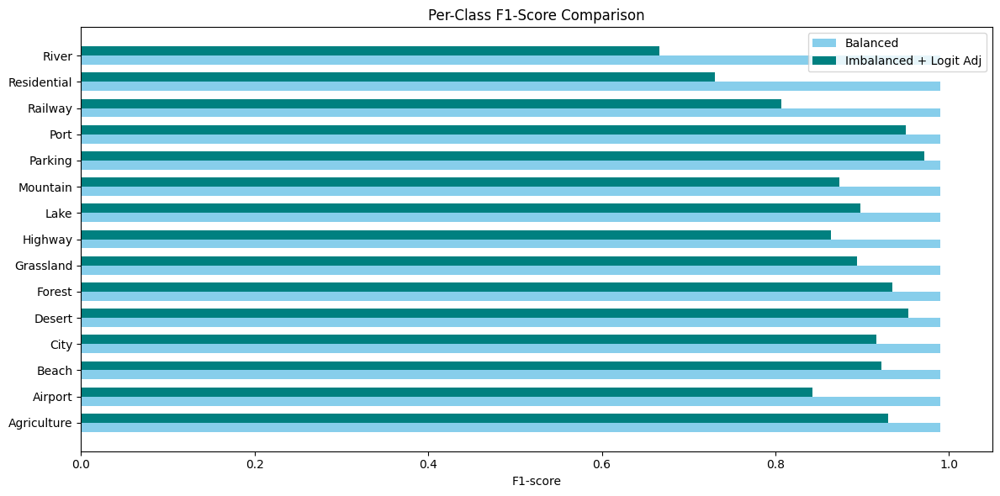

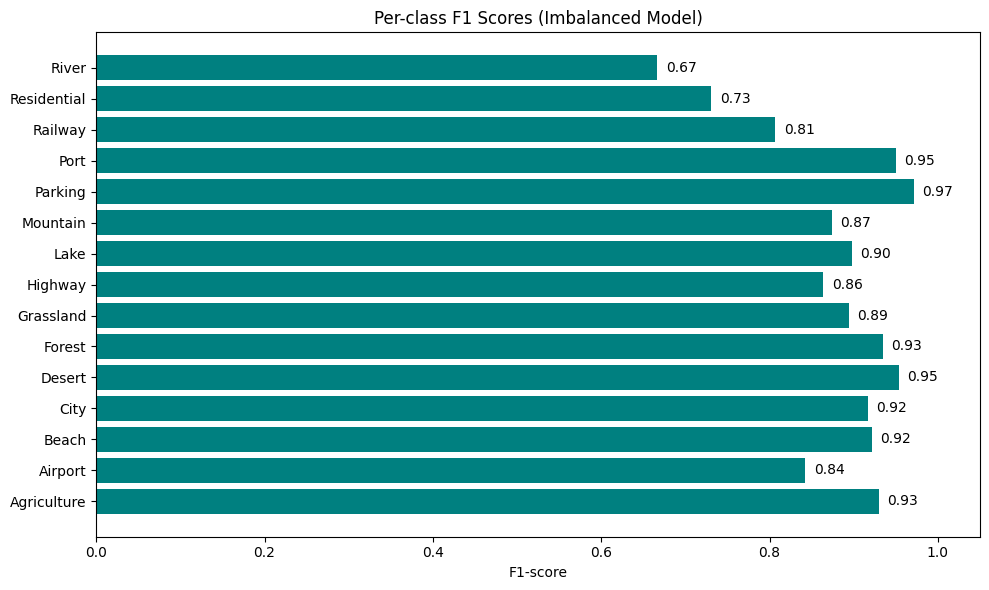

/tmp/ipykernel_99/3496205038.py:370: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))



📊 Classification Report:

              precision    recall  f1-score   support

 Agriculture       0.88      0.98      0.93       177
     Airport       0.99      0.73      0.84       146
       Beach       0.91      0.93      0.92       127
        City       0.97      0.87      0.92       127
      Desert       0.98      0.93      0.95       121
      Forest       0.91      0.97      0.93       119
   Grassland       0.98      0.82      0.89        97
     Highway       0.88      0.85      0.86        86
        Lake       0.89      0.90      0.90        73
    Mountain       0.81      0.95      0.87        55
     Parking       0.96      0.99      0.97        69
        Port       0.95      0.95      0.95        60
     Railway       0.71      0.90      0.80        50
 Residential       0.63      0.86      0.73        22
       River       0.53      0.90      0.67        21

    accuracy                           0.90      1350
   macro avg       0.87      0.90      0.88      1350

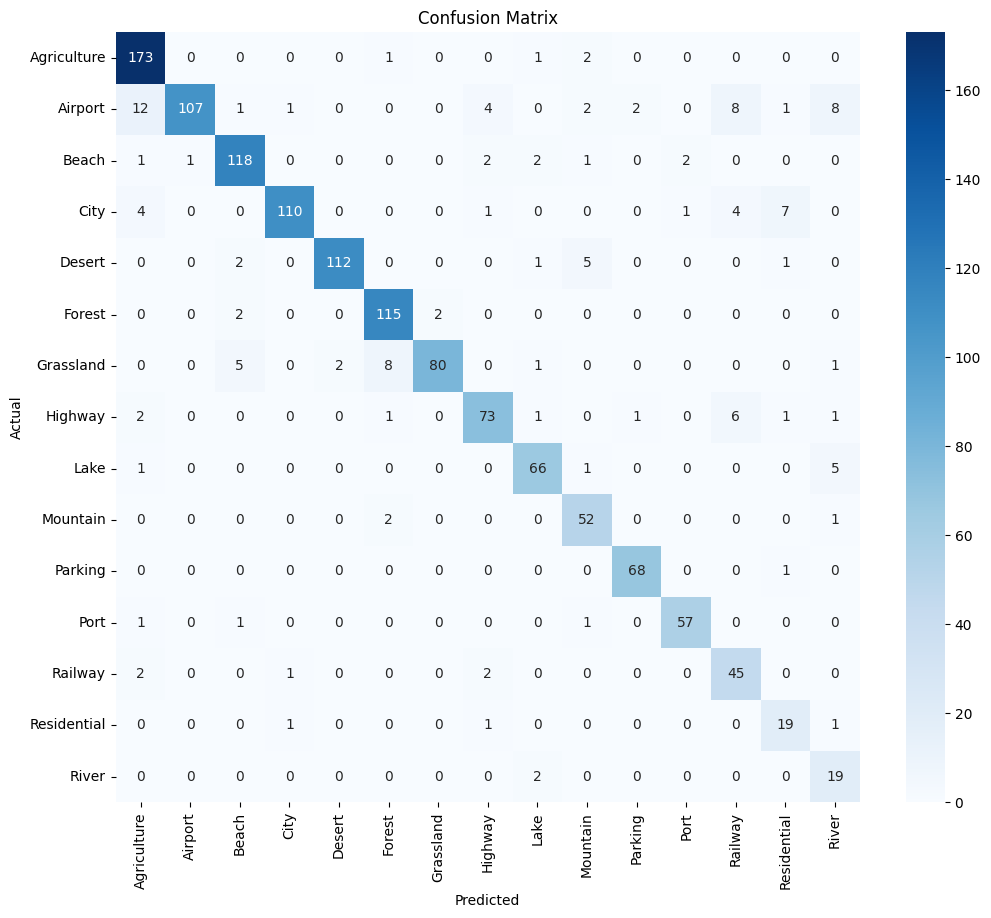

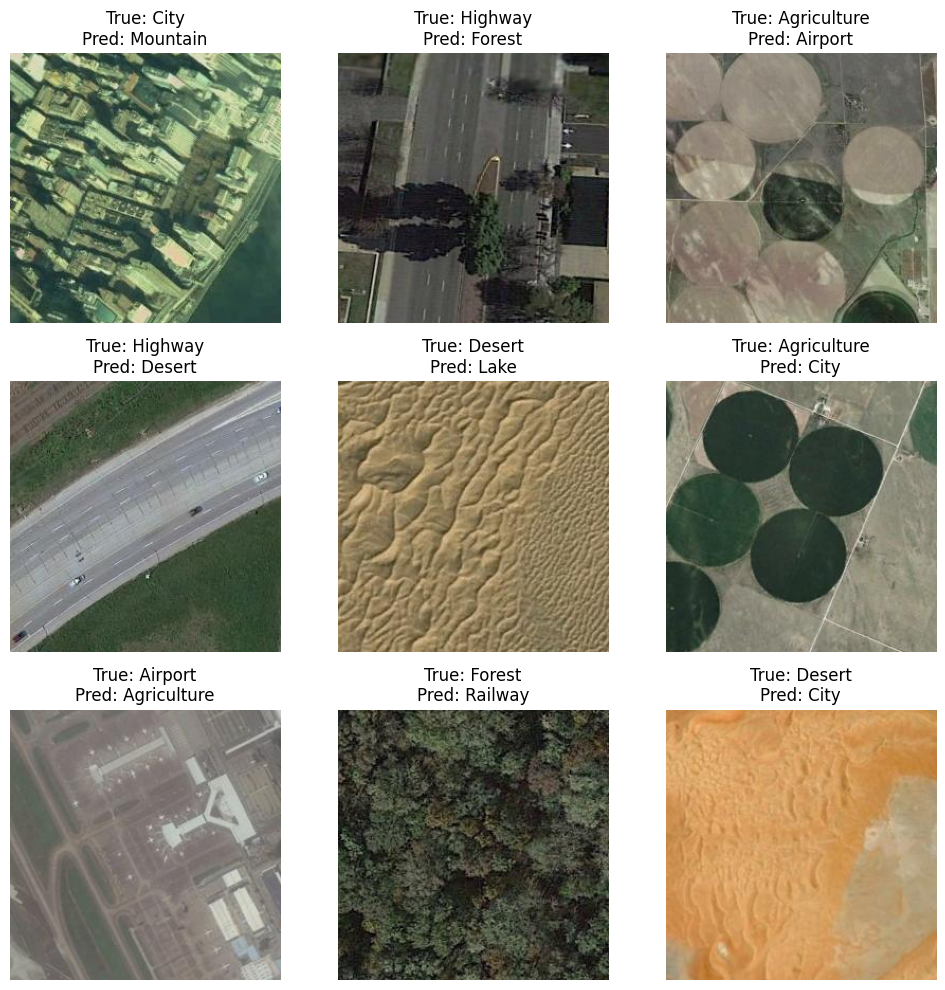

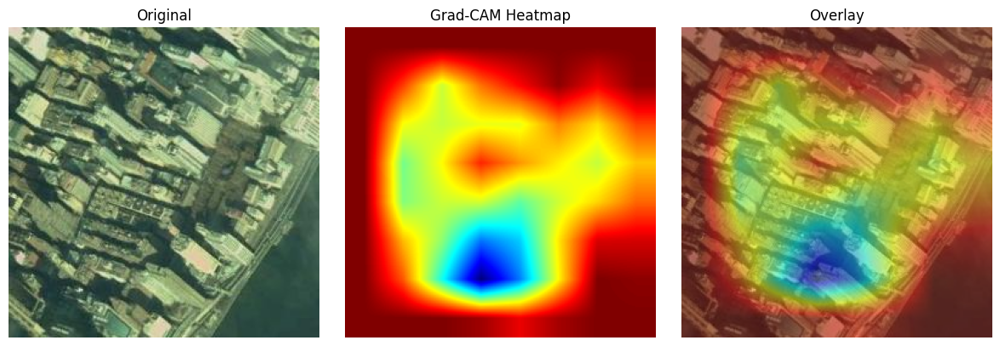

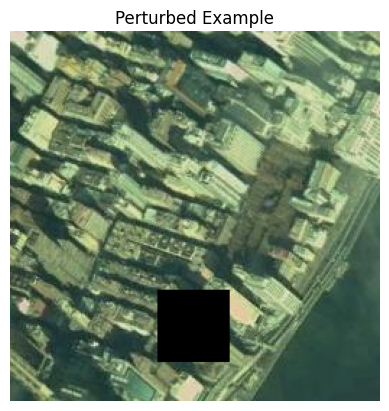

Predicted class: Lake


In [12]:
# -------------------------------
# 1. Imports
# -------------------------------
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.metrics import precision_recall_fscore_support
import cv2

# -------------------------------
# 2. Dataset Path & Params
# -------------------------------
data_dir = "/kaggle/input/skyview-an-aerial-landscape-dataset/Aerial_Landscapes"
img_size = 256
batch_size = 32
seed = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set random seeds
random.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)

# -------------------------------
# 3. Define Transforms (MixUp will be applied in training loop)
# -------------------------------
train_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

# -------------------------------
# 4. Load Dataset (Simulate Long-Tailed Imbalance)
# -------------------------------

# Target long-tailed distribution: 800, 700, ..., 50 (per class)
long_tail_counts = [800 - i*50 for i in range(15)]  # [800, 750, ..., 50]
class_indices = {i: [] for i in range(len(train_dataset.classes))}

for idx, (_, label) in enumerate(train_dataset.samples):
    class_indices[label].append(idx)

imbalanced_indices = []
for class_id, target_count in enumerate(long_tail_counts):
    selected = class_indices[class_id][:target_count]  # take top-N per class
    imbalanced_indices.extend(selected)

random.shuffle(imbalanced_indices)
split = int(0.2 * len(imbalanced_indices))
val_idx = imbalanced_indices[:split]
train_idx = imbalanced_indices[split:]

# Save the new imbalanced split (optional)
# np.save("train_indices_imbalanced.npy", train_idx)
# np.save("val_indices_imbalanced.npy", val_idx)

train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=train_sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size, sampler=val_sampler)
np.save("train_indices.npy", train_idx)
np.save("val_indices.npy", val_idx)

train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
val_sampler = torch.utils.data.SubsetRandomSampler(val_idx)

train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=train_sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size, sampler=val_sampler)


# -------------------------------
# 4.1 Visualize Imbalanced Distribution
# -------------------------------
plt.figure(figsize=(10, 5))
plt.bar(range(len(long_tail_counts)), long_tail_counts, tick_label=train_dataset.classes, color='orange')
plt.xticks(rotation=45, ha='right')
plt.title('Simulated Long-Tailed Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.tight_layout()
plt.show()
# -------------------------------
# 5. MixUp Function
# # -------------------------------
# def mixup_data(x, y, alpha=0.2):
#     lam = np.random.beta(alpha, alpha)
#     batch_size = x.size()[0]
#     index = torch.randperm(batch_size)
#     mixed_x = lam * x + (1 - lam) * x[index, :]
#     y_a, y_b = y, y[index]
#     return mixed_x, y_a, y_b, lam

# def mixup_criterion(criterion, pred, y_a, y_b, lam):
#     return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# -------------------------------
# 6. Build Model (EfficientNetB0)
# -------------------------------
# Stage 1: Feature Extractor Training
# -------------------------------
model = torchvision.models.efficientnet_b0(pretrained=True)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model.to(device)

# -------------------------------
# 6.1 Create Class Weights
# -------------------------------
class_counts = np.zeros(num_classes)
for idx in train_idx:
    _, label = train_dataset.samples[idx]
    class_counts[label] += 1
class_weights = 1. / class_counts
weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

# -------------------------------
# 7. Train Model (Stage 1: Feature Extractor with Weighted Loss)
# -------------------------------
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss(weight=weights_tensor)
epochs = 30
early_stop_patience = 3
best_val_loss = np.inf
patience_counter = 0

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, targets in train_loader:
        # Remove MixUp
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()

    train_losses.append(running_loss / len(train_loader))
    train_accuracies.append(correct / total)

    # Validation
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

    val_losses.append(val_loss / len(val_loader))
    val_accuracies.append(correct / total)

    print(f"Epoch {epoch+1}: Train Acc: {train_accuracies[-1]:.4f}, Val Acc: {val_accuracies[-1]:.4f}")

    if val_losses[-1] < best_val_loss:
        best_val_loss = val_losses[-1]
        torch.save(model.state_dict(), "efficientnet_mixup_best.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= early_stop_patience:
            print("Early stopping triggered.")
            break

# -------------------------------
# 7.1 Decoupled Training Stage 2: Freeze Base, Retrain Classifier Only
# -------------------------------
model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))
# Compute F1-stage1
# _, _, f1_stage1, _ = precision_recall_fscore_support(y_true_stage1, y_pred_stage1, labels=list(range(len(val_dataset.classes))))

for param in model.features.parameters():
    param.requires_grad = False

# Reset optimizer for classifier only
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

# Retrain classifier (3 epochs)
print("▶️ Stage 2: Retraining classifier head...")
for epoch in range(3):
    model.train()
    total = 0
    correct = 0
    running_loss = 0
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()
    print(f"Epoch {epoch+1} (Stage 2): Classifier Accuracy: {correct / total:.4f}, Loss: {running_loss / len(train_loader):.4f}")

# Save final model
torch.save(model.state_dict(), "efficientnet_mixup_stage2.pth")
# precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, labels=list(range(len(val_dataset.classes))))
# f1_stage2 = f1

# Evaluate stage 2 model on validation set
model.load_state_dict(torch.load("efficientnet_mixup_stage2.pth"))
model.eval()

y_true_stage2 = []
y_pred_stage2 = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        y_true_stage2.extend(labels.cpu().numpy())
        y_pred_stage2.extend(preds.cpu().numpy())

# Compute F1 for stage 2
_, _, f1_stage2, _ = precision_recall_fscore_support(y_true_stage2, y_pred_stage2, labels=list(range(len(val_dataset.classes))))


# -------------------------------
# 8. Plot Accuracy & Loss
# -------------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_accuracies, label='Train')
plt.plot(val_accuracies, label='Val')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_losses, label='Train')
plt.plot(val_losses, label='Val')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------
# 9.3 Stage 2 vs Stage 1 F1-score Comparison (Post-Retraining)
# -------------------------------


# Load pre-stage2 model (just before classifier retraining)
model_stage1 = torchvision.models.efficientnet_b0(pretrained=False)
model_stage1.classifier[1] = nn.Linear(model_stage1.classifier[1].in_features, num_classes)
model_stage1.load_state_dict(torch.load("efficientnet_mixup_best.pth"))
model_stage1.to(device)
model_stage1.eval()

# Evaluate again without logit adjustment or retraining
y_pred_stage1 = []
y_true_stage1 = []
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model_stage1(inputs)
        _, predicted = torch.max(outputs, 1)
        y_pred_stage1.extend(predicted.cpu().numpy())
        y_true_stage1.extend(labels.numpy())

_, _, f1_stage1, _ = precision_recall_fscore_support(y_true_stage1, y_pred_stage1, labels=list(range(len(val_dataset.classes))))


# Plot comparison
x = np.arange(len(val_dataset.classes))
width = 0.35

plt.figure(figsize=(12, 6))
plt.barh(x - width/2, f1_stage1, height=width, label='Stage 1 (before retraining)', color='orange')
plt.barh(x + width/2, f1_stage2, height=width, label='Stage 2 (after retraining)', color='green')
plt.yticks(x, val_dataset.classes)
plt.xlabel('F1-score')
plt.title('Per-Class F1 Score Comparison: Stage 1 vs Stage 2')
plt.xlim(0, 1.05)
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------
# 9.2 F1-score Comparison (Balanced vs. Imbalanced)
# -------------------------------
# Example F1-scores from a balanced model (you can replace this with your actual values)
f1_balanced = [0.99] * len(val_dataset.classes)  # placeholder for balanced model

# Plot comparison
x = np.arange(len(val_dataset.classes))
width = 0.35

plt.figure(figsize=(12, 6))
plt.barh(x - width/2, f1_balanced, height=width, label='Balanced', color='skyblue')
plt.barh(x + width/2, f1, height=width, label='Imbalanced + Logit Adj', color='teal')
plt.yticks(x, val_dataset.classes)
plt.xlabel('F1-score')
plt.title('Per-Class F1-Score Comparison')
plt.xlim(0, 1.05)
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------
# 9.1 F1-score Visualization
# -------------------------------


# Compute per-class metrics
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, labels=list(range(len(val_dataset.classes))))

# Horizontal bar plot
plt.figure(figsize=(10, 6))
plt.barh(val_dataset.classes, f1, color='teal')
plt.xlabel('F1-score')
plt.title('Per-class F1 Scores (Imbalanced Model)')
plt.xlim(0, 1.05)
for i, v in enumerate(f1):
    plt.text(v + 0.01, i, f"{v:.2f}", va='center')
plt.tight_layout()
plt.show()

# -------------------------------
# 9. Logit Adjustment Function (Optional: Post-hoc Calibration)
# -------------------------------
def apply_logit_adjustment(logits, class_counts, tau=1.0):
    priors = torch.tensor(class_counts / np.sum(class_counts), dtype=torch.float).to(device)
    adjustment = tau * torch.log(priors + 1e-12)
    return logits + adjustment

# -------------------------------
# 9. Evaluation on Validation Set: Confusion Matrix + Report + Samples
# -------------------------------
y_true = []
y_pred = []
model.load_state_dict(torch.load("efficientnet_mixup_best.pth"))
model.eval()
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true.extend(labels.numpy())
        y_pred.extend(predicted.cpu().numpy())

print("\n📊 Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=val_dataset.classes))

acc = accuracy_score(y_true, y_pred)
print(f"\n✅ Overall Accuracy: {acc:.4f}")

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=val_dataset.classes, yticklabels=val_dataset.classes, cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Sample visualization
sample_loader = DataLoader(val_dataset, batch_size=9, sampler=val_sampler)
sample_images, sample_labels = next(iter(sample_loader))
sample_images, sample_labels = sample_images.to(device), sample_labels.to(device)

model.eval()
perturbed_tensor.requires_grad_()  # Enable gradients
output = model(perturbed_tensor)
pred_idx = output.argmax(dim=1).item()


plt.figure(figsize=(10, 10))
for i in range(9):
    img = sample_images[i].permute(1, 2, 0).cpu().numpy()
    true_label = val_dataset.classes[sample_labels[i]]
    pred_label = val_dataset.classes[pred_labels[i]]
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis("off")
plt.tight_layout()
plt.show()



# # Register GradCAM on last conv layer
cam_extractor = GradCAM(model, target_layer="features")

# # Pick a sample from validation set
# sample_image = sample_images[0].unsqueeze(0).to(device)
sample_image = sample_images[0].unsqueeze(0).to(device)
sample_image.requires_grad = True  # Important for CAM
output = model(sample_image)
pred_class = output.argmax().item()

# Extract CAM
activation_map = cam_extractor(pred_class, output)[0].squeeze().cpu().numpy()

# Display image + heatmap
img_np = sample_images[0].permute(1, 2, 0).cpu().numpy()
heatmap = cv2.resize(activation_map, (img_np.shape[1], img_np.shape[0]))
heatmap = np.uint8(255 * heatmap / np.max(heatmap))
heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
blended = cv2.addWeighted(to_uint8(sample_images[0]), 0.5, heatmap_color, 0.5, 0)

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(to_uint8(sample_images[0]))
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(heatmap_color)
plt.title("Grad-CAM Heatmap")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(blended)
plt.title("Overlay")
plt.axis("off")
plt.tight_layout()
plt.show()

# Perturbation examples

# Convert to uint8 image
def to_uint8(tensor_img):
    img = tensor_img.permute(1, 2, 0).cpu().numpy()
    img = (img * 255).astype(np.uint8)
    return img

def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.uint8)
    return np.clip(img + noise, 0, 255)

def add_occlusion(img, size=50):
    h, w = img.shape[:2]
    x = np.random.randint(0, w - size)
    y = np.random.randint(0, h - size)
    img = img.copy()
    img[y:y+size, x:x+size] = 0
    return img

def apply_blur(img, k=5):
    return cv2.GaussianBlur(img, (k, k), 0)

# Example:
perturbed = add_occlusion(to_uint8(sample_images[0]))
plt.imshow(perturbed)
plt.title("Perturbed Example")
plt.axis("off")
plt.show()

perturbed_tensor = transforms.ToTensor()(perturbed).unsqueeze(0).to(device)
model.eval()
model.eval()
perturbed_tensor.requires_grad_()  # Enables gradient for CAM
output = model(perturbed_tensor)
print("Predicted class:", val_dataset.classes[pred_idx])



🔍 Minority Class F1-score Comparison
      Class  F1 Stage 1  F1 Stage 2
Residential    0.730769    0.933333
      River    0.666667    0.926829


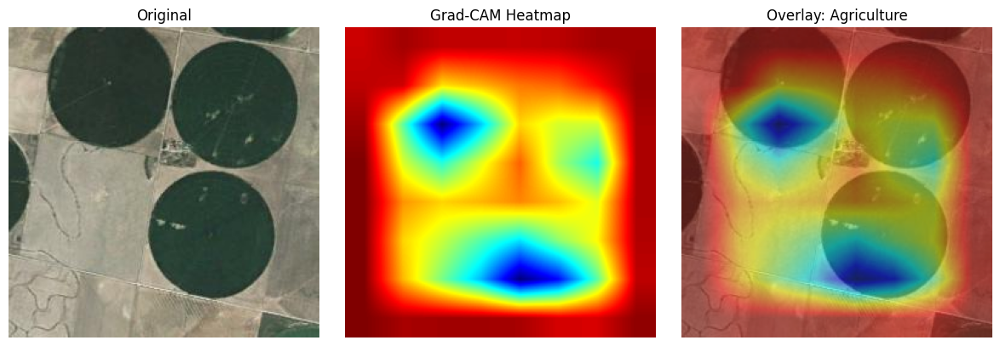

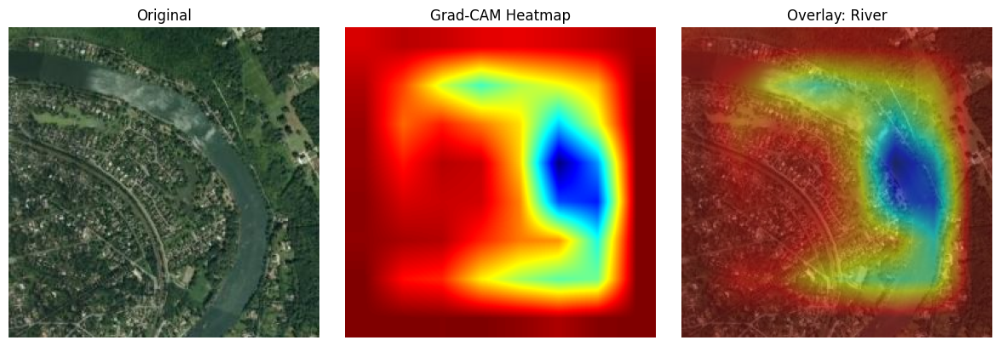

In [8]:
# -------------------------------
# 1. Imports
# -------------------------------
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_fscore_support
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import pandas as pd

# -------------------------------
# Additional Utility Functions
# -------------------------------
def visualize_misclassified(model, dataloader, class_names, device, num_samples=10):
    model.eval()
    misclassified = []
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            preds = torch.argmax(outputs, 1)
            for i in range(len(labels)):
                if preds[i] != labels[i]:
                    misclassified.append((inputs[i], labels[i], preds[i]))
                if len(misclassified) >= num_samples:
                    break
            if len(misclassified) >= num_samples:
                break

    plt.figure(figsize=(15, 6))
    for i, (img, true, pred) in enumerate(misclassified):
        ax = plt.subplot(2, 5, i+1)
        img = img.permute(1, 2, 0).cpu().numpy()
        plt.imshow(img)
        plt.title(f"True: {class_names[true]}\nPred: {class_names[pred]}")
        plt.axis("off")
    plt.suptitle("Sample Misclassified Images")
    plt.tight_layout()
    plt.show()

# -------------------------------
# After Stage 2 F1 Calculation (Add table)
# -------------------------------
minority_classes = ['Residential', 'River']
minority_indices = [val_dataset.class_to_idx[c] for c in minority_classes]
minority_df = pd.DataFrame({
    'Class': minority_classes,
    'F1 Stage 1': [f1_stage1[i] for i in minority_indices],
    'F1 Stage 2': [f1_stage2[i] for i in minority_indices],
})
print("\n🔍 Minority Class F1-score Comparison")
print(minority_df.to_string(index=False))

# -------------------------------
# Grad-CAM for High vs Low Frequency Classes
# -------------------------------
from torchcam.methods import GradCAM
from torchvision.transforms.functional import normalize
from torchvision.transforms import ToTensor
from PIL import Image

def to_uint8(tensor_img):
    img = tensor_img.permute(1, 2, 0).cpu().numpy()
    img = (img * 255).astype(np.uint8)
    return img

def show_gradcam_for_class(class_name):
    class_idx = val_dataset.class_to_idx[class_name]
    cam_extractor = GradCAM(model, target_layer="features")
    model.eval()
    for img, label in val_dataset:
        if label == class_idx:
            input_tensor = img.unsqueeze(0).to(device)
            with torch.set_grad_enabled(True):
                input_tensor.requires_grad_()
                out = model(input_tensor)
                pred_class = out.argmax().item()
                activation_map = cam_extractor(pred_class, out)[0].squeeze().cpu().numpy()

            img_np = img.permute(1, 2, 0).numpy()
            heatmap = cv2.resize(activation_map, (img_np.shape[1], img_np.shape[0]))
            heatmap = np.uint8(255 * heatmap / np.max(heatmap))
            heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
            blended = cv2.addWeighted(to_uint8(img), 0.5, heatmap_color, 0.5, 0)

            plt.figure(figsize=(12, 4))
            plt.subplot(1, 3, 1)
            plt.imshow(to_uint8(img))
            plt.title("Original")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(heatmap_color)
            plt.title("Grad-CAM Heatmap")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(blended)
            plt.title(f"Overlay: {class_name}")
            plt.axis("off")
            plt.tight_layout()
            plt.show()
            break

# Visualize for one high-frequency and one low-frequency class
show_gradcam_for_class("Agriculture")  # high freq
show_gradcam_for_class("River")        # low freq

In [12]:
!pip install torchcam --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.1 MB/s eta 0:00:00


# **Grad-CAM Visual Comparison on Perturbed Images**

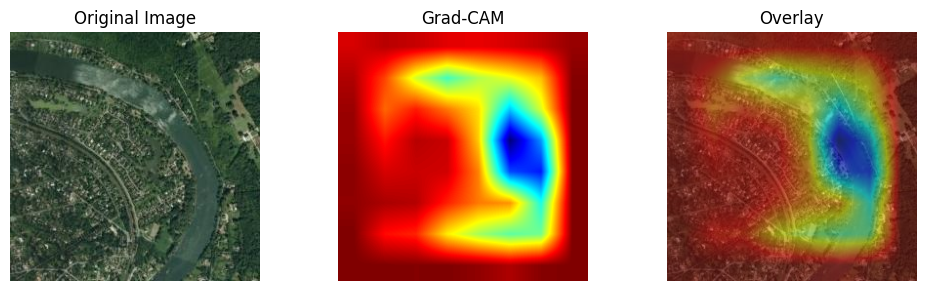

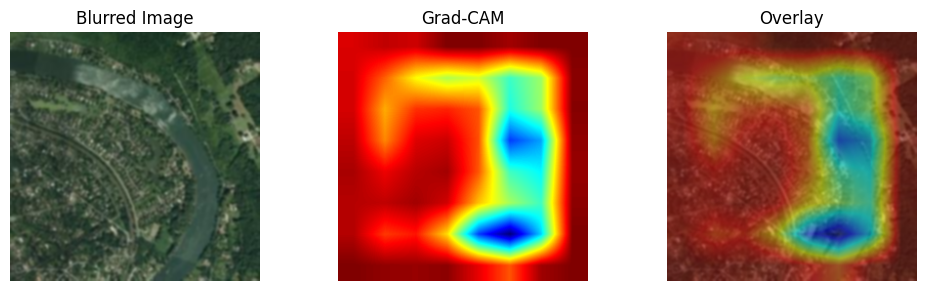

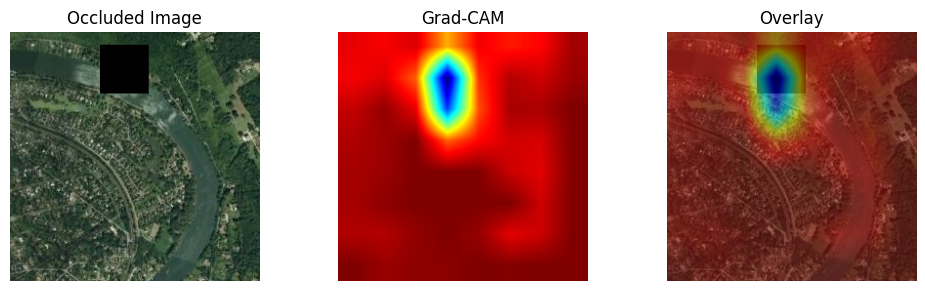

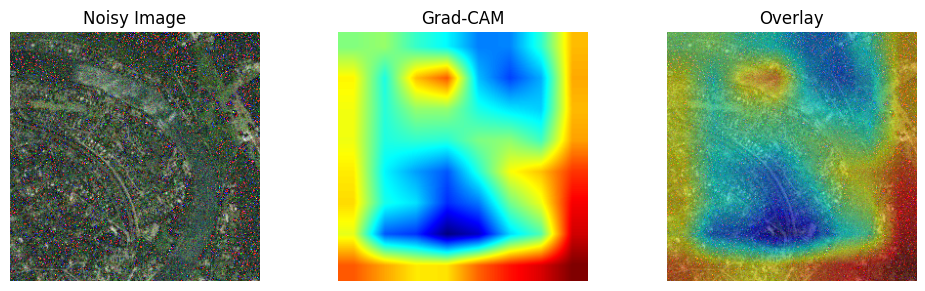

In [9]:
from torchcam.methods import GradCAM
import cv2
import matplotlib.pyplot as plt
import numpy as np

def to_uint8(tensor_img):
    img = tensor_img.permute(1, 2, 0).cpu().numpy()
    return (img * 255).astype(np.uint8)

def apply_blur(img):
    return cv2.GaussianBlur(img, (5, 5), 0)

def add_occlusion(img, size=50):
    img = img.copy()
    h, w = img.shape[:2]
    x = np.random.randint(0, w - size)
    y = np.random.randint(0, h - size)
    img[y:y+size, x:x+size] = 0
    return img

def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.uint8)
    return np.clip(img + noise, 0, 255)

def show_gradcam_overlay(model, image_np, device, title):
    transform = transforms.ToTensor()
    image_tensor = transform(image_np).unsqueeze(0).to(device)

    model.eval()
    cam_extractor = GradCAM(model, target_layer="features")
    with torch.set_grad_enabled(True):
        image_tensor.requires_grad_()
        output = model(image_tensor)
        pred_class = output.argmax().item()
        activation_map = cam_extractor(pred_class, output)[0].squeeze().cpu().numpy()

    heatmap = cv2.resize(activation_map, (256, 256))
    heatmap = np.uint8(255 * heatmap / np.max(heatmap))
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(image_np, 0.5, heatmap_color, 0.5, 0)

    plt.figure(figsize=(10, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(image_np)
    plt.title(f"{title} Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_color)
    plt.title("Grad-CAM")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Example usage (replace with actual image tensor from val_loader)
# sample_tensor = "/kaggle/input/skyview-an-aerial-landscape-dataset/Aerial_Landscapes/River/001.jpg"  # already on device
# original = to_uint8(sample_tensor)
from PIL import Image
image_path = "/kaggle/input/skyview-an-aerial-landscape-dataset/Aerial_Landscapes/River/001.jpg"
image_pil = Image.open(image_path).convert("RGB")
image_tensor = transforms.Resize((256, 256))(transforms.ToTensor()(image_pil))
original = to_uint8(image_tensor)

blurred = apply_blur(original)
occluded = add_occlusion(original)
noisy = add_noise(original)

# Run comparisons
show_gradcam_overlay(model, original, device, "Original")
show_gradcam_overlay(model, blurred, device, "Blurred")
show_gradcam_overlay(model, occluded, device, "Occluded")
show_gradcam_overlay(model, noisy, device, "Noisy")
